---
---
---
# CSC8635 Mini-projects
## Introduction

This document defines three project-style questions which go more deeply into different aspects of the module's content. You have to answer **ALL** of these project-stye questions.

The learning objectives of this assignment are:
1. To learn about the design of machine learning analysis pipelines
2. To understand how to select appropriate methods given the dataset type
3. To learn how to conduct machine learning experimentation in a rigorous and effective manner
4. To critically evaluate the performance of the designed machine learning pipelines
5. To learn and practice the skills of reporting machine learning experiments

For this coursework you will be provided with three different datasets each of a different nature:
1. A tabular dataset (defined as a classification problem)
2. A tabular dataset (defined as a regression problem)
3. A text dataset

Your job is easy to state: You should design a range of machine learning pipelines appropriate to the nature of each dataset. Overall, we expect that you will perform a thorough investigation involving (whenever relevant) all parts of a machine learning pipeline (exploration, preprocessing, model training, model interpretation and evaluation), evaluating a range of options for all parts of the pipeline and with proper hyperparameter tuning.

You will have to write a short report (as part of this notebook) that presents the experiments you did, their justification, a detailed description of the performance of your designed pipelines using the most appropriate presentation tools (e.g., tables of results, plots). We expect that you should be able to present your work at a level of detail that would enable a fellow student to reproduce your steps.

## Deliverables
An inline report and code blocks addressing the marking scheme below. The report is expected to have 1000 to 2000 words. The word count excludes references, tables, figures, code blocks and section headers, and has a 10% leeway.

## Marking scheme

- Dataset exploration: 10 marks
- Methods: 30 marks
- Results of analysis: 30 marks
- Discussion: 20 marks
- Presentation (Writing Style, references, figures, etc.): 10 marks

This marking scheme will be applied separately to each mini-project. The overall mark will give 40% weight to mini-projects 1 and 2 (classification and regression) and 20% weight to mini-project 3 (NLP).

Some help for good marks:
- Split your work up into separate code blocks to help the reader understand what you have done.
- Provide text blocks, between code blocks, which help expalin what your code blocks are doing.
- It's not just about applying the first pipeline you find and using default hyperparameters but trying different pipelines and optimising the hyperparameters.
- We expect the solutions that you use to be based on the machine learning techniques you have been taught in the lectures/practicals.
- Note there are marks for presentation, so think about this both for the code, outputs and text you write.

---
---
## Dataset 1: Classification

The dataset, called FARS, is a collection of statistics of US road traffic accidents. The class label (target variable) is about the severity of the accident. It has 20 features and over 100K examples. The dataset is available in Canvas as a CSV file, in which the last column contains the class labels: https://ncl.instructure.com/courses/59112/files/8967354?wrap=1

## What you need to do:

You will need to perform the following steps on the dataset:
1. EDA
2. Data normalisation
3. Split the data into training and test sets using cross-validation
4. Develop **four** machine learning pipelines for classifying the severity of the accident
5. Present the results for your pipelines using the most appropriate set of metrics.
6. Provide a short report on which approaches you used and which gave the best results. It would be good to consider why particular pipelines gave the best results.

Some help for good marks:
- We expect that you evaluate a very broad range of options for the design of your machine learning pipelines, including (but not limited to) data normalisation, feature/instance selection, class imbalance correction, several (appropriate) machine learning models and hyperparameter tuning.


## Your answer below

In [2]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn import metrics
from xgboost import XGBClassifier
import xgboost as xgb
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from skrebate import ReliefF
%matplotlib inline

### 1. Exploratory Data Analysis (EDA)

This dataset contains statistics on US road traffic accidents across 51 states. The data summary report from `ydata_profiling` highlights 3 issues within the dataset, including duplicated rows, data imbalance (with some variables also containing many zero values), and feature correlation.

In [4]:
# Data loading
dataset1 = pd.read_csv("fars.csv")

In [5]:
# Generate data summary
profile = ProfileReport(dataset1, title='Pandas Profiling Report')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Focusing on the taget variable (**INJURY_SEVERITY**), there are 8 classes of severity but the report shows that 4 variables including `Possible_Injury`, `Unknown`, `Injured_Severity_Unknown` and `Died_Prior_to_Accident` classes are relatively low compared to others. Therefore, generating model class weighting, stratified $k$-fold cross validation and synthetic samples for minority class are investigated in this report and find the best pipeline to handle this issue. The table below shows the distribution of each class across this dataset.

In [7]:
dataset1.iloc[:,-1].value_counts().reset_index()

,INJURY_SEVERITY,count
0,Fatal_Injury,42116
1,No_Injury,20007
2,Incapaciting_Injury,15072
3,Nonincapaciting_Evident_Injury,13890
4,Possible_Injury,8674
5,Unknown,901
6,Injured_Severity_Unknown,299
7,Died_Prior_to_Accident,9


This dataset contains only four numerical columns, while the rest are categorical. The report indicates that all numerical columns exhibit high variance, which can significantly affect certain types of machine learning models. Additionally, encoding the categorical columns is incorporated as part of the preprocessing process.

In [9]:
## Numerical data exploration
numeric_columns = dataset1.select_dtypes(include='number')
variance = numeric_columns.var()
print(variance)

AGE                              488.836237
ALCOHOL_TEST_RESULT             1789.829014
DRUG_TEST_RESULTS_(1_of_3)    156969.687446
DRUG_TEST_RESULTS_(2_of_3)     87077.820101
DRUG_TEST_RESULTS_(3_of_3)     85334.840761
dtype: float64


In [10]:
## Catagorical data exploration
dataset1.select_dtypes(include='object').columns

Index(['CASE_STATE', 'SEX', 'PERSON_TYPE', 'SEATING_POSITION',
       'RESTRAINT_SYSTEM-USE', 'AIR_BAG_AVAILABILITY/DEPLOYMENT', 'EJECTION',
       'EJECTION_PATH', 'EXTRICATION', 'NON_MOTORIST_LOCATION',
       'POLICE_REPORTED_ALCOHOL_INVOLVEMENT', 'METHOD_ALCOHOL_DETERMINATION',
       'ALCOHOL_TEST_TYPE', 'POLICE-REPORTED_DRUG_INVOLVEMENT',
       'METHOD_OF_DRUG_DETERMINATION', 'DRUG_TEST_TYPE_(1_of_3)',
       'DRUG_TEST_TYPE_(2_of_3)', 'DRUG_TEST_TYPE_(3_of_3)', 'HISPANIC_ORIGIN',
       'TAKEN_TO_HOSPITAL', 'RELATED_FACTOR_(1)-PERSON_LEVEL',
       'RELATED_FACTOR_(2)-PERSON_LEVEL', 'RELATED_FACTOR_(3)-PERSON_LEVEL',
       'RACE', 'INJURY_SEVERITY'],
      dtype='object')

In addition, creating the machine learning model from all variables in this dataset might lead to overfitting. Thus, two feature reduction techniques including correlation thresholding and Recursive Feature Elimination (RFE) is investigated in this report.

### 2. Data Preprocessing
This section outlines the general preprocessing steps for all pipelines, including dropping duplicate rows, categorical encoding, and target encoding.

#### 2.1) Drop duplicate rows

In [19]:
# Drop duplicate rows
duplicate_rows = dataset1[dataset1.duplicated()]
print("Total duplicate rows =", len(duplicate_rows))
dataset1 = dataset1.drop_duplicates()
duplicate_rows = dataset1[dataset1.duplicated()]
print("Remain duplicate rows =", len(duplicate_rows))

Total duplicate rows = 7964
Remain duplicate rows = 0


#### 2.2) Encode feature columns to numerical

In [22]:
## Preprocess feature variables
df_feature = dataset1.iloc[:,:-1]
categorical_column = df_feature.select_dtypes(include='object').columns
# Change feature columns to numerical
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
X_encoded = encoder.fit_transform(df_feature[categorical_column])
X_numeric = df_feature.drop(columns=categorical_column).values
X_preprocessed = np.hstack((X_numeric, X_encoded))
X_preprocessed.shape

(93004, 362)

Create preprocessed dataframe with encoded column

In [25]:
## Check result after encoding
# Get columns name of numerical and catagorical
numerical_columns_name = df_feature.drop(columns=categorical_column).columns
catagorical_columns_name = encoder.get_feature_names_out(categorical_column)
# Append into one list
all_columns_name = list(numerical_columns_name) + list(catagorical_columns_name)

# Create new dataframe with preprocessed feature columns
df_preprocessed = pd.DataFrame(X_preprocessed, columns=all_columns_name)
df_preprocessed["INJURY_SEVERITY"] = dataset1.iloc[:,-1].values
df_preprocessed.head()

,AGE,ALCOHOL_TEST_RESULT,DRUG_TEST_RESULTS_(1_of_3),DRUG_TEST_RESULTS_(2_of_3),DRUG_TEST_RESULTS_(3_of_3),CASE_STATE_Alabama,CASE_STATE_Alaska,CASE_STATE_Arizona,CASE_STATE_Arkansas,CASE_STATE_California,...,RACE_Korean,RACE_Multiple_Races_(Individual_races_not_specified;_ex._mixed),RACE_Not_a_Fatality_(Not_Applicable),RACE_Other_Asian_or_Pacific_Islander,RACE_Other_Indian_(Includes_South_and_Central_America),RACE_Samoan,RACE_Unknown,RACE_Vietnamese,RACE_White,INJURY_SEVERITY
0,34.0,97.0,999.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Fatal_Injury
1,20.0,96.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Fatal_Injury
2,43.0,96.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Fatal_Injury
3,38.0,96.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,Incapaciting_Injury
4,50.0,97.0,999.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Fatal_Injury


After encoding, the number of feature columns increases from 29 to 362, while maintaining the same row order.

In [28]:
# Original dataset
dataset1.head()

,CASE_STATE,AGE,SEX,PERSON_TYPE,SEATING_POSITION,RESTRAINT_SYSTEM-USE,AIR_BAG_AVAILABILITY/DEPLOYMENT,EJECTION,EJECTION_PATH,EXTRICATION,...,DRUG_TEST_RESULTS_(2_of_3),DRUG_TEST_TYPE_(3_of_3),DRUG_TEST_RESULTS_(3_of_3),HISPANIC_ORIGIN,TAKEN_TO_HOSPITAL,RELATED_FACTOR_(1)-PERSON_LEVEL,RELATED_FACTOR_(2)-PERSON_LEVEL,RELATED_FACTOR_(3)-PERSON_LEVEL,RACE,INJURY_SEVERITY
0,Alabama,34,Male,Driver,Front_Seat_-_Left_Side_(Drivers_Side),None_Used/Not_Applicable,Air_Bag_Available_but_Not_Deployed_for_this_Seat,Totally_Ejected,Unknown,Not_Extricated,...,0,Not_Tested_for_Drugs,0,Non-Hispanic,No,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,White,Fatal_Injury
1,Alabama,20,Male,Driver,Front_Seat_-_Left_Side_(Drivers_Side),None_Used/Not_Applicable,Deployed_Air_Bag_from_Front,Totally_Ejected,Unknown,Not_Extricated,...,0,Not_Tested_for_Drugs,0,Non-Hispanic,No,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,White,Fatal_Injury
2,Alabama,43,Male,Driver,Front_Seat_-_Left_Side_(Drivers_Side),Lap_and_Shoulder_Belt,Air_Bag_Not_Available_for_this_Seat,Not_Ejected,Not_Ejected/Not_Applicable,Extricated,...,0,Not_Tested_for_Drugs,0,Non-Hispanic,No,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,Black,Fatal_Injury
3,Alabama,38,Female,Passenger_of_a_Motor_Vehicle_in_Transport,Front_Seat_-_Right_Side,Lap_and_Shoulder_Belt,Air_Bag_Not_Available_for_this_Seat,Not_Ejected,Not_Ejected/Not_Applicable,Extricated,...,0,Not_Tested_for_Drugs,0,Not_a_Fatality_(Not_Applicable),Yes,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_a_Fatality_(Not_Applicable),Incapaciting_Injury
4,Alabama,50,Male,Driver,Front_Seat_-_Left_Side_(Drivers_Side),Lap_and_Shoulder_Belt,Deployed_Air_Bag_from_Front,Not_Ejected,Not_Ejected/Not_Applicable,Not_Extricated,...,0,Not_Tested_for_Drugs,0,Non-Hispanic,Yes,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,Not_Applicable_-_Driver/None_-_All_Other_Persons,Black,Fatal_Injury


#### 2.3) Encode target column to numerical

In [31]:
## Preprocess target variable
y = df_preprocessed.iloc[:,-1].values
# Change taget column to numerical
le = preprocessing.LabelEncoder()
y = le.fit_transform(y)
df_preprocessed['INJURY_SEVERITY'] = y

# Mapping class number and actual label
class_mapping = {index: label for index, label in enumerate(le.classes_)}
print("Class to Number Mapping:")
for number, label in class_mapping.items():
    print(f"{number}: {label}")

Class to Number Mapping:
0: Died_Prior_to_Accident
1: Fatal_Injury
2: Incapaciting_Injury
3: Injured_Severity_Unknown
4: No_Injury
5: Nonincapaciting_Evident_Injury
6: Possible_Injury
7: Unknown


In [33]:
df_preprocessed.head()

,AGE,ALCOHOL_TEST_RESULT,DRUG_TEST_RESULTS_(1_of_3),DRUG_TEST_RESULTS_(2_of_3),DRUG_TEST_RESULTS_(3_of_3),CASE_STATE_Alabama,CASE_STATE_Alaska,CASE_STATE_Arizona,CASE_STATE_Arkansas,CASE_STATE_California,...,RACE_Korean,RACE_Multiple_Races_(Individual_races_not_specified;_ex._mixed),RACE_Not_a_Fatality_(Not_Applicable),RACE_Other_Asian_or_Pacific_Islander,RACE_Other_Indian_(Includes_South_and_Central_America),RACE_Samoan,RACE_Unknown,RACE_Vietnamese,RACE_White,INJURY_SEVERITY
0,34.0,97.0,999.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
1,20.0,96.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
2,43.0,96.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,38.0,96.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,50.0,97.0,999.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


### 3. Pipeline

#### 3.1) Pipeline 1

In this pipeline, the `RandomForestClassifier` is used as the estimator because it is well-suited for large datasets and does not require data scaling [1]. To handle the class imbalance issue, the model is assigned larger panalty on the minority class. In addition, correlation thresholding is applied to filter out redundant columns before creating the model, reducing the complexity of the training process.

In [37]:
## Correlation thresholding 
# Calculate correlation matrix
corr_matrix = df_preprocessed.iloc[:, :-1].corr().abs()

# Get upper triangle of the correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Drop features with correlation greater than 0.70
drop_column = [column for column in upper.columns if any(upper[column] > 0.70)]

# Drop the columns from the dataframe
df_pipeline1 = df_preprocessed.drop(drop_column, axis=1)

# Display the resulting dataframe
print("Number of features after correlation thresholding:", df_pipeline1.shape[1])
print("Dropped features:", drop_column)

Number of features after correlation thresholding: 332
Dropped features: ['DRUG_TEST_RESULTS_(3_of_3)', 'SEX_Male', 'PERSON_TYPE_Passenger_of_a_Motor_Vehicle_in_Transport', 'SEATING_POSITION_Front_Seat_-_Left_Side_(Drivers_Side)', 'SEATING_POSITION_Non-Motorist', 'AIR_BAG_AVAILABILITY/DEPLOYMENT_Non-Motorist', 'EJECTION_Totally_Ejected', 'EJECTION_PATH_Not_Ejected/Not_Applicable', 'EJECTION_PATH_Unknown', 'EXTRICATION_Not_Extricated', 'NON_MOTORIST_LOCATION_Not_Applicable_-_Vehicle_Occupant', 'ALCOHOL_TEST_TYPE_Not_Tested_for_Alcohol', 'ALCOHOL_TEST_TYPE_Whole_Blood', 'POLICE-REPORTED_DRUG_INVOLVEMENT_Not_Reported', 'DRUG_TEST_TYPE_(1_of_3)_Not_Tested_for_Drugs', 'DRUG_TEST_TYPE_(1_of_3)_Unknown_if_Tested_for_Drugs', 'DRUG_TEST_TYPE_(2_of_3)_Not_Tested_for_Drugs', 'DRUG_TEST_TYPE_(2_of_3)_Unknown_if_Tested_for_Drugs', 'DRUG_TEST_TYPE_(3_of_3)_Blood_Test', 'DRUG_TEST_TYPE_(3_of_3)_Not_Tested_for_Drugs', 'DRUG_TEST_TYPE_(3_of_3)_Unknown_if_Tested_for_Drugs', 'TAKEN_TO_HOSPITAL_Yes', 'REL

In [38]:
# Prepare feature and target arrays
X = df_pipeline1.iloc[:, :-1].values
y = df_pipeline1.iloc[:, -1].values

# Model setting
random_classifier = RandomForestClassifier(class_weight="balanced", max_depth=10, n_estimators=200)
param_grid = {'max_depth': [10, 20, 30],'n_estimators': [100, 200, 300]}
scores_f1, preds, probs, actual_labels = ([] for i in range(4))
best_estimator_pipeline1 = None
best_score = -np.inf

# Start the timer
start_time = time.time()

# Cross-validation loop
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in kf.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # Hyperparameters tuning
    grid_search = GridSearchCV(random_classifier, param_grid=param_grid, cv=5,
                               scoring="f1_macro", verbose=1, n_jobs = 5)
    grid_search.fit(X_train, y_train)

    estimator = grid_search.best_estimator_
    print("Best model for this fold:", grid_search.best_params_)
    print("Best F1 score for this fold:", grid_search.best_score_)

    # Keep track of the best model across folds
    if grid_search.best_score_ > best_score:
        best_score = grid_search.best_score_
        best_estimator_pipeline1 = estimator
    
    predictions_proba = estimator.predict_proba(X_test)
    predictions = np.argmax(predictions_proba, axis=1)
    preds.extend(predictions)
    probs.extend(predictions_proba)
    actual_labels.extend(y_test)

    score = metrics.f1_score(y_test, predictions, average='macro')
    print("F1 score for this test set: {0}".format(score))
    scores_f1.append(score)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time

# Report the overall F1 score
print("Overall F1 score: {0}".format(np.average(scores_f1)))

# Explore feature important
if best_estimator_pipeline1 is not None:
    # Extract feature importance from the best estimator
    feature_importance = best_estimator_pipeline1.feature_importances_

    # Create a DataFrame to display the feature importances
    feature_importance_df = pd.DataFrame({
        'Feature': df_pipeline1.columns[:-1],
        'Importance': feature_importance
    })

    # Sort by importance in descending order
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

    # Print the top 10 important features
    print("")
    print("Top 10 important features from the best model:")
    print(feature_importance_df.head(10))

Fitting 5 folds for each of 9 candidates, totalling 45 fits


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best model for this fold: {'max_depth': 20, 'n_estimators': 200}
Best F1 score for this fold: 0.4256205791380248
F1 score for this test set: 0.5027934856573191
Fitting 5 folds for each of 9 candidates, totalling 45 fits


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best model for this fold: {'max_depth': 20, 'n_estimators': 100}
Best F1 score for this fold: 0.4266325356943078
F1 score for this test set: 0.5080900641008828
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best model for this fold: {'max_depth': 20, 'n_estimators': 300}
Best F1 score for this fold: 0.4304021482788336
F1 score for this test set: 0.5234045812577667
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best model for this fold: {'max_depth': 20, 'n_estimators': 300}
Best F1 score for this fold: 0.42875252346793485
F1 score for this test set: 0.492143217964404
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best model for this fold: {'max_depth': 20, 'n_estimators': 200}
Best F1 score for this fold: 0.4310474733458703
F1 score for this test set: 0.5011282013562515
Overall F1 score: 0.5055119100673247

Top 10 important features from the best model:
                                             Feature  Importance
0                             

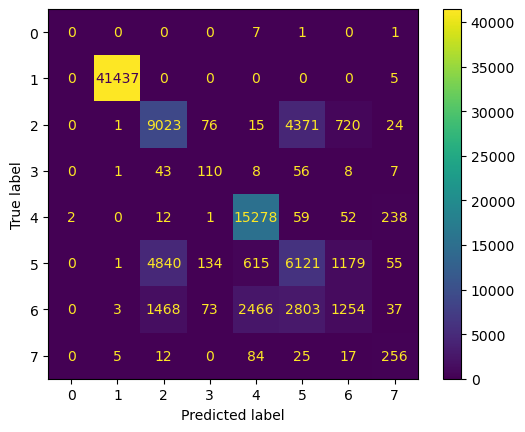


Total execution time: 964.11 seconds


In [39]:
# Confusion Matrix
cm = metrics.confusion_matrix(actual_labels, preds)
disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y))
disp.plot()
plt.show()

print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))


**Discussion**

Overall, the model demonstrates strong performance in estimating `Fatal_Injury (Class 1)`, with a low misclassification rate.  While it performs well in classifying `No_Injury (Class 4)`, it struggles to differentiate between `No_Injury (Class 4)` and `Possible_Injury (Class 6)`. The classes `Died_Prior_to_Accident (Class 0)`, `Injured_Severity_Unknown (Class 3)`, and `Unknown (Class 7)` have relatively low sample sizes, resulting in poor classification performance for these categories. Furthermore, the confusion matrix indicates that the model encounters challenges in distinguishing between `Incapacitating_Injury (Class 2)`, `Nonincapacitating_Evident_Injury (Class 5)`, and `Possible_Injury (Class 6)`. Additionally, since the training data contains more than 300 features, the execution time exceeded 15 minutes for 45 fits. Therefore, the dimensionality of the training data should be reduced before proceeding with the model training process in the next pipeline.

#### 3.2) Pipeline 2

In this pipeline, the `XGBClassifier` is used as the estimator, as it is known for its efficiency in handling large datasets [2]. The performance results are then compared with Pipeline 1 (Random Forest model). To optimize computational efficiency, the training data is filtered to retain only the columns with feature importance greater than 0.001 from the previous pipeline.

In [42]:
## Filtering by feature importance
# Extract the important feature column name
threshold = 0.001
important_features = feature_importance_df[feature_importance_df['Importance'] > threshold]['Feature']

# Create a new DataFrame with important features for pipeline 2
df_pipeline2 = df_preprocessed[important_features].copy()

# Add the 'INJURY_SEVERITY' column to the new DataFrame
df_pipeline2['INJURY_SEVERITY'] = df_pipeline1.iloc[:, -1].values

df_pipeline2

,AGE,TAKEN_TO_HOSPITAL_No,HISPANIC_ORIGIN_Not_a_Fatality_(Not_Applicable),CASE_STATE_New_Jersey,HISPANIC_ORIGIN_Non-Hispanic,HISPANIC_ORIGIN_Unknown,RESTRAINT_SYSTEM-USE_Unknown,TAKEN_TO_HOSPITAL_Unknown,ALCOHOL_TEST_RESULT,SEX_Unknown,...,CASE_STATE_Massachusetts,CASE_STATE_New_Mexico,METHOD_ALCOHOL_DETERMINATION_Other_(e.g._Saliva_test),NON_MOTORIST_LOCATION_Non-Intersection_-_On_Roadway_Crosswalk_not_Available,SEATING_POSITION_Second_Seat_-_Middle,CASE_STATE_Louisiana,METHOD_OF_DRUG_DETERMINATION_Other,AIR_BAG_AVAILABILITY/DEPLOYMENT_Deployed_Air_Bag_Multiple_Directions,METHOD_ALCOHOL_DETERMINATION_Preliminary_Breath_Test_(PBT),INJURY_SEVERITY
0,34.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,97.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,20.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,96.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,43.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,96.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,38.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,96.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,50.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,97.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92999,10.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,96.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
93000,9.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,96.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
93001,7.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,96.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6
93002,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,96.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6


In [43]:
# Create X and Y array for model training
X = df_pipeline2.iloc[:, :-1].values
y = df_pipeline2.iloc[:, -1].values

# Model setting
xgb_classifier = XGBClassifier(objective="multi:softmax", num_class=7, max_depth=3, n_estimators=200,
                               eval_metric="mlogloss", tree_method="hist")
param_grid = {'max_depth': [5, 10, 15], 'n_estimators': [100, 200, 500]}
scores_f1, preds = [], []
best_estimator_pipeline2 = None
best_score = -np.inf

# Start timer
start_time = time.time()

# Cross-validation loop
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in kf.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    grid_search = GridSearchCV(xgb_classifier, param_grid=param_grid, cv=5, scoring="f1_macro", verbose=1, n_jobs=3)
    grid_search.fit(X_train, y_train)

    estimator = grid_search.best_estimator_
    print("Best model for this fold:", grid_search.best_params_)
    print("Best F1 score for this fold:", grid_search.best_score_)

    # Keep track of the best model across folds
    if grid_search.best_score_ > best_score:
        best_score = grid_search.best_score_
        best_estimator_pipeline2 = estimator

    predictions = estimator.predict(X_test)  # Use predict directly
    preds.extend(predictions)

    score = metrics.f1_score(y_test, predictions, average='macro')
    print(f"F1 score for this test set: {score}")
    scores_f1.append(score)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time

print(f"\nOverall F1 score: {np.mean(scores_f1)}")
print(f"\nTotal execution time: {elapsed_time:.2f} seconds")

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best model for this fold: {'max_depth': 15, 'n_estimators': 500}
Best F1 score for this fold: 0.41943027054051996
F1 score for this test set: 0.453126945699901
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best model for this fold: {'max_depth': 5, 'n_estimators': 100}
Best F1 score for this fold: 0.41320399007868447
F1 score for this test set: 0.4997420156340139
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best model for this fold: {'max_depth': 10, 'n_estimators': 100}
Best F1 score for this fold: 0.4135714848094948
F1 score for this test set: 0.5004049244968934
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best model for this fold: {'max_depth': 15, 'n_estimators': 500}
Best F1 score for this fold: 0.41808474258622674
F1 score for this test set: 0.4555636368421444
Fitting 5 folds for each of 9 candidates, totalling 45 fits


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best model for this fold: {'max_depth': 15, 'n_estimators': 200}
Best F1 score for this fold: 0.4044890680453084
F1 score for this test set: 0.4632388103678581

Overall F1 score: 0.47441526660816213

Total execution time: 1167.43 seconds


Overall F1 score: 0.47441526660816213


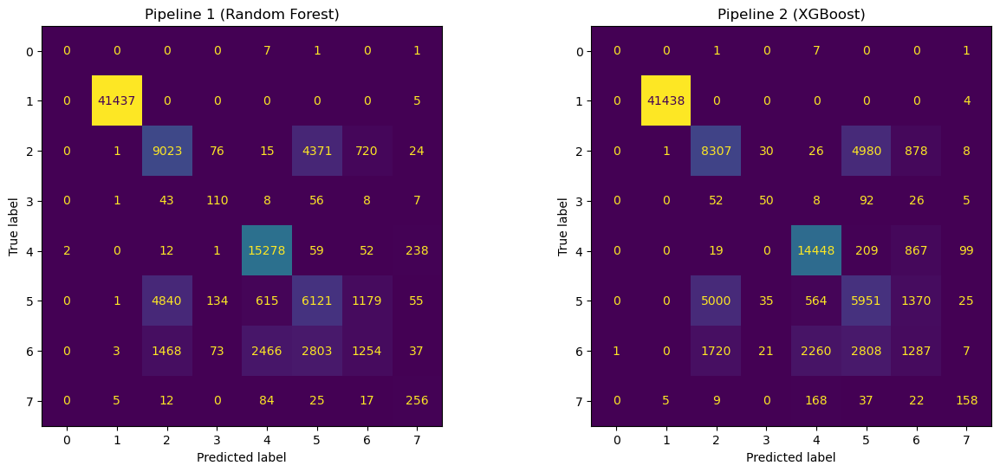

In [44]:
# Overall F1 score
print("Overall F1 score: {0}".format(np.average(scores_f1)))

# Confusion Matrix
cm2 = metrics.confusion_matrix(actual_labels, preds)
disp2 = metrics.ConfusionMatrixDisplay(confusion_matrix=cm2, display_labels=np.unique(y))

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot the confusion matrix for RandomForest
axes[0].set_title("Pipeline 1 (Random Forest)")
disp.plot(ax=axes[0], colorbar=False) 

# Plot the confusion matrix for XGBoost
axes[1].set_title("Pipeline 2 (XGBoost)")
disp2.plot(ax=axes[1], colorbar=False) 
plt.show()

**Discussion**

The F1-score values and confusion matrices indicate that the second pipeline, which uses `XGBoost`, performs slightly worse than the first pipeline. However, both pipelines show poor performance on classes with small sample sizes.

#### 3.3) Pipeline 3

This pipeline aim to explore feature selection techniques. While the ReliefF method was initially considered, it was found to be computationally intensive, leading to memory leaks and session crashes on the Apple M2 system (16 GB RAM). As a result, `Recursive Feature Elimination (RFE)` was selected as a more suitable feature selection method for this dataset and training environment.

To enhance the evaluation process, the dataset is split into three subsets including training, validation, and testing. The validation set is used during the `StratifiedKFold` process for hyperparameter tuning, while the final model is evaluated on the testing set to ensure unbiased assessment. 

**Model Training**

In [64]:
## Create train and test set (for evaluate the actual performance from unseen data)
X = df_pipeline2.iloc[:, :-1].values
y = df_pipeline2.iloc[:, -1].values

In [66]:
## Split data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y)

In [68]:
# Check the class distribution in the training set
train_classes, train_counts = np.unique(y_train, return_counts=True)
print("Training set class distribution:")
count = 0
for item in train_classes:
    print(f"Class {item}: {train_counts[count]}")
    count+=1

# Check the class distribution in the test set
test_classes, test_counts = np.unique(y_test, return_counts=True)
print("\nTest set class distribution:")
count = 0
for item in test_classes:
    print(f"Class {item}: {test_counts[count]}")
    count+=1

Training set class distribution:
Class 0: 7
Class 1: 33154
Class 2: 11384
Class 3: 186
Class 4: 12514
Class 5: 10356
Class 6: 6483
Class 7: 319

Test set class distribution:
Class 0: 2
Class 1: 8288
Class 2: 2846
Class 3: 47
Class 4: 3128
Class 5: 2589
Class 6: 1621
Class 7: 80


In [70]:
## Setting selector and classifier
random_classifier = RandomForestClassifier(class_weight="balanced", max_depth=20, n_estimators=200)
selector = RFE(random_classifier, n_features_to_select = 40, step=5)
param_grid = {'FS__n_features_to_select': [50, 60, 70],
              'classifier__max_depth': [20, 30],
              'classifier__n_estimators': [200, 300]}
pipeline = Pipeline([("FS", selector), ("classifier",random_classifier)])

# Setting parameters
scores_f1, preds, probs, actual_labels = ([] for i in range(4))
start_time = time.time()
best_estimator_pipeline3 = None 
best_score = -np.inf

# Training model
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in kf.split(X_train, y_train):
    X_train_fold, X_test_fold = X[train_index], X[test_index]
    Y_train_fold, y_test_fold = y[train_index], y[test_index]

    grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring="f1_macro", verbose=1, n_jobs=5)
    grid_search.fit(X_train_fold, Y_train_fold)

    estimator = grid_search.best_estimator_
    print("Best model for this fold:", grid_search.best_params_)
    print("Best F1 score for this fold:", grid_search.best_score_)

    # Keep track of the best model across folds
    if grid_search.best_score_ > best_score:
        best_score = grid_search.best_score_
        best_estimator_pipeline3 = estimator

    predictions_proba = estimator.predict_proba(X_test_fold)
    predictions = np.argmax(predictions_proba, axis=1)
    preds.extend(predictions)
    probs.extend(predictions_proba)
    actual_labels.extend(y_test_fold)

    score = metrics.f1_score(y_test_fold, predictions, average='macro')
    print("F1 score for this test set: {0}".format(score))
    scores_f1.append(score)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time

print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

# Report the overall F1 score
print("")
print("Overall F1 score: {0}".format(np.average(scores_f1)))

Fitting 5 folds for each of 12 candidates, totalling 60 fits


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best model for this fold: {'FS__n_features_to_select': 60, 'classifier__max_depth': 20, 'classifier__n_estimators': 300}
Best F1 score for this fold: 0.4218466599126363
F1 score for this test set: 0.5555994127044942
Fitting 5 folds for each of 12 candidates, totalling 60 fits


/opt/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best model for this fold: {'FS__n_features_to_select': 60, 'classifier__max_depth': 20, 'classifier__n_estimators': 300}
Best F1 score for this fold: 0.4123068802414493
F1 score for this test set: 0.575984384774482
Fitting 5 folds for each of 12 candidates, totalling 60 fits


/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Best model for this fold: {'FS__n_features_to_select': 70, 'classifier__max_depth': 20, 'classifier__n_estimators': 200}
Best F1 score for this fold: 0.4292075208922716
F1 score for this test set: 0.5085359040310754
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best model for this fold: {'FS__n_features_to_select': 60, 'classifier__max_depth': 20, 'classifier__n_estimators': 200}
Best F1 score for this fold: 0.41409121762525913
F1 score for this test set: 0.5063173679403397
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best model for this fold: {'FS__n_features_to_select': 70, 'classifier__max_depth': 20, 'classifier__n_estimators': 200}
Best F1 score for this fold: 0.42162442596218924
F1 score for this test set: 0.4854147113951683

Total execution time: 2626.95 seconds

Overall F1 score: 0.5263703561691119


**Evaluation**

              precision    recall  f1-score   support

     Class_0       1.00      0.50      0.67         2
     Class_1       1.00      1.00      1.00      8288
     Class_2       0.72      0.70      0.71      2846
     Class_3       0.64      0.83      0.72        47
     Class_4       0.86      0.99      0.92      3128
     Class_5       0.58      0.68      0.63      2589
     Class_6       0.70      0.33      0.45      1621
     Class_7       0.74      0.88      0.80        80

    accuracy                           0.85     18601
   macro avg       0.78      0.74      0.74     18601
weighted avg       0.85      0.85      0.84     18601



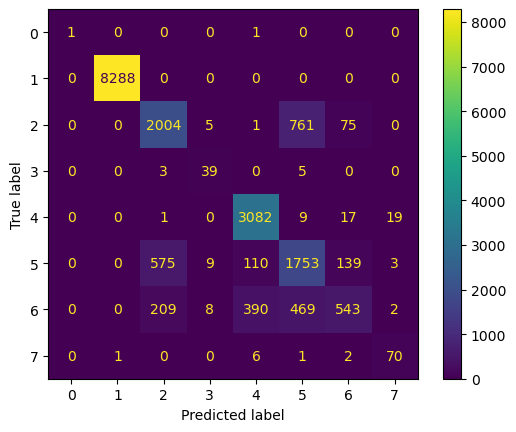

In [72]:
# Predict the result using test set
predictions_proba = best_estimator_pipeline3.predict_proba(X_test)
predictions = np.argmax(predictions_proba, axis=1)

# Generate classification report
unique_labels = np.unique(y_test)
target_names = [f"Class_{label}" for label in unique_labels]
report = classification_report(y_test, predictions, target_names=target_names, labels=unique_labels)
print(report)

# Confusion Matrix
cm3 = metrics.confusion_matrix(y_test, predictions)
disp3 = metrics.ConfusionMatrixDisplay(confusion_matrix=cm3, display_labels=np.unique(y))
disp3.plot()
plt.show()

**Discussion**

The classification report highlights that the model performs well in predicting Class 1 and shows moderate performance for Class 2 and Class 4. However, the model struggles with Class 5 and Class 6, as indicated by their lower F1-scores and confusion matrix. Additionally, the model fails to capture the characteristics of Classes 0, 3, and 7 due to the small size of training data for these classes.

#### 3.4) Pipeline 4

In this pipeline,  the `SMOTE` technique is used to oversampling the minority classes which are `Died_Prior_to_Accident`, `Injured_Severity_Unknown`, `Nonincapaciting_Evident_Injury`, `Possible_Injury` and `Unknown` in order to handle data imbalance. Additionally, since the second and third pipelines rely on the output of the first pipeline to reduce the number of features, they cannot function independently. Therefore, this pipeline aim to explore the use of `Recursive Feature Elimination (RFE)` to select features from the entire dataset. The classifier employs the optimal hyperparameters identified in the previous pipeline (max_depth = 20 and n_estimators = 200) to balance accuracy and computational efficiency.

In [56]:
## Correlation thresholding 
# Calculate correlation matrix
corr_matrix = df_preprocessed.iloc[:, :-1].corr().abs()

# Get upper triangle of the correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Drop features with correlation greater than 0.70
drop_column = [column for column in upper.columns if any(upper[column] > 0.70)]

# Drop the columns from the dataframe
df_pipeline4 = df_preprocessed.drop(drop_column, axis=1)

# Display the resulting dataframe
print("Number of features after correlation thresholding:", df_pipeline4.shape[1])
print("Dropped features:", drop_column)

Number of features after correlation thresholding: 332
Dropped features: ['DRUG_TEST_RESULTS_(3_of_3)', 'SEX_Male', 'PERSON_TYPE_Passenger_of_a_Motor_Vehicle_in_Transport', 'SEATING_POSITION_Front_Seat_-_Left_Side_(Drivers_Side)', 'SEATING_POSITION_Non-Motorist', 'AIR_BAG_AVAILABILITY/DEPLOYMENT_Non-Motorist', 'EJECTION_Totally_Ejected', 'EJECTION_PATH_Not_Ejected/Not_Applicable', 'EJECTION_PATH_Unknown', 'EXTRICATION_Not_Extricated', 'NON_MOTORIST_LOCATION_Not_Applicable_-_Vehicle_Occupant', 'ALCOHOL_TEST_TYPE_Not_Tested_for_Alcohol', 'ALCOHOL_TEST_TYPE_Whole_Blood', 'POLICE-REPORTED_DRUG_INVOLVEMENT_Not_Reported', 'DRUG_TEST_TYPE_(1_of_3)_Not_Tested_for_Drugs', 'DRUG_TEST_TYPE_(1_of_3)_Unknown_if_Tested_for_Drugs', 'DRUG_TEST_TYPE_(2_of_3)_Not_Tested_for_Drugs', 'DRUG_TEST_TYPE_(2_of_3)_Unknown_if_Tested_for_Drugs', 'DRUG_TEST_TYPE_(3_of_3)_Blood_Test', 'DRUG_TEST_TYPE_(3_of_3)_Not_Tested_for_Drugs', 'DRUG_TEST_TYPE_(3_of_3)_Unknown_if_Tested_for_Drugs', 'TAKEN_TO_HOSPITAL_Yes', 'REL

In [57]:
## Create train and test set (for evaluate the actual performance from unseen data)
X = df_pipeline4.iloc[:, :-1].values
y = df_pipeline4.iloc[:, -1].values

In [58]:
print("Original distribution")
counter = Counter(y)
for k,v in counter.items():
	per = v / len(y) * 100
	print('Class=%d, n=%d (%.3f%%)' % (k, v, per))

Original distribution
Class=1, n=41442 (44.559%)
Class=2, n=14230 (15.300%)
Class=4, n=15642 (16.819%)
Class=6, n=8104 (8.714%)
Class=7, n=399 (0.429%)
Class=5, n=12945 (13.919%)
Class=3, n=233 (0.251%)
Class=0, n=9 (0.010%)


In [59]:
## Strategy for oversampling (only class 0, 3, 5, 6, 7)
sampling_strategy = {0:15000, 3:15000, 5:15000,
                     6:15000, 7:15000,}

oversample = SMOTE(sampling_strategy=sampling_strategy, random_state=42)
X, y = oversample.fit_resample(X, y)

## Investigate distribution after applying SMOTE
print("SMOTE distribution")
counter = Counter(y)
for k,v in counter.items():
	per = v / len(y) * 100
	print('Class=%d, n=%d (%.3f%%)' % (k, v, per))

SMOTE distribution
Class=1, n=41442 (28.324%)
Class=2, n=14230 (9.726%)
Class=4, n=15642 (10.691%)
Class=6, n=15000 (10.252%)
Class=7, n=15000 (10.252%)
Class=5, n=15000 (10.252%)
Class=3, n=15000 (10.252%)
Class=0, n=15000 (10.252%)


In [60]:
## Split data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y)

In [61]:
# Check the class distribution in the training set
train_classes, train_counts = np.unique(y_train, return_counts=True)
print("Training set class distribution:")
count = 0
for item in train_classes:
    print(f"Class {item}: {train_counts[count]}")
    count+=1

# Check the class distribution in the test set
test_classes, test_counts = np.unique(y_test, return_counts=True)
print("\nTest set class distribution:")
count = 0
for item in test_classes:
    print(f"Class {item}: {test_counts[count]}")
    count+=1

Training set class distribution:
Class 0: 12000
Class 1: 33153
Class 2: 11384
Class 3: 12000
Class 4: 12514
Class 5: 12000
Class 6: 12000
Class 7: 12000

Test set class distribution:
Class 0: 3000
Class 1: 8289
Class 2: 2846
Class 3: 3000
Class 4: 3128
Class 5: 3000
Class 6: 3000
Class 7: 3000


In [62]:
## Setting selector and classifier
random_classifier = RandomForestClassifier(class_weight="balanced", max_depth=20, n_estimators=200)
selector = RFE(random_classifier, n_features_to_select = 20, step=5)
param_grid = {'FS__n_features_to_select': [60, 70, 80],}
pipeline = Pipeline([("FS", selector), ("classifier",random_classifier)])

# Setting parameters
scores_f1, preds, probs, actual_labels = ([] for i in range(4))
start_time = time.time()
best_estimator_pipeline4 = None 
best_score = -np.inf

# Training model
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in kf.split(X_train, y_train):
    X_train_fold, X_test_fold = X[train_index], X[test_index]
    Y_train_fold, y_test_fold = y[train_index], y[test_index]

    grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring="f1_macro", verbose=1, n_jobs=5)
    grid_search.fit(X_train_fold, Y_train_fold)

    estimator = grid_search.best_estimator_
    print("Best model for this fold:", grid_search.best_params_)
    print("Best F1 score for this fold:", grid_search.best_score_)

    # Keep track of the best model across folds
    if grid_search.best_score_ > best_score:
        best_score = grid_search.best_score_
        best_estimator_pipeline4 = estimator

    predictions_proba = estimator.predict_proba(X_test_fold)
    predictions = np.argmax(predictions_proba, axis=1)
    preds.extend(predictions)
    probs.extend(predictions_proba)
    actual_labels.extend(y_test_fold)

    score = metrics.f1_score(y_test_fold, predictions, average='macro')
    print("F1 score for this test set: {0}".format(score))
    scores_f1.append(score)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time

print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

# Report the overall F1 score
print("")
print("Overall F1 score: {0}".format(np.average(scores_f1)))

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best model for this fold: {'FS__n_features_to_select': 60}
Best F1 score for this fold: 0.6544154913977552
F1 score for this test set: 0.7008357464657513
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best model for this fold: {'FS__n_features_to_select': 60}
Best F1 score for this fold: 0.652001758593162
F1 score for this test set: 0.7054153351480333
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best model for this fold: {'FS__n_features_to_select': 60}
Best F1 score for this fold: 0.6494097375583575
F1 score for this test set: 0.716676200162778
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best model for this fold: {'FS__n_features_to_select': 60}
Best F1 score for this fold: 0.6519437317958683
F1 score for this test set: 0.6933892315979726
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best model for this fold: {'FS__n_features_to_select': 60}
Best F1 score for this fold

              precision    recall  f1-score   support

     Class_0       1.00      1.00      1.00      3000
     Class_1       1.00      1.00      1.00      8289
     Class_2       0.65      0.70      0.67      2846
     Class_3       0.70      0.99      0.82      3000
     Class_4       0.75      0.98      0.85      3128
     Class_5       0.54      0.64      0.59      3000
     Class_6       0.78      0.22      0.35      3000
     Class_7       0.98      0.70      0.82      3000

    accuracy                           0.82     29263
   macro avg       0.80      0.78      0.76     29263
weighted avg       0.84      0.82      0.81     29263



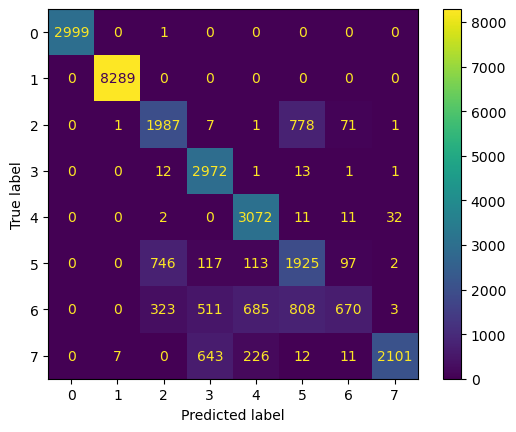

In [119]:
predictions_proba = best_estimator_pipeline4.predict_proba(X_test)
predictions = np.argmax(predictions_proba, axis=1)

# Generate classification report
unique_labels = np.unique(y_test)
target_names = [f"Class_{label}" for label in unique_labels]
report = classification_report(y_test, predictions, target_names=target_names, labels=unique_labels)
print(report)

# Confusion Matrix
cm4 = metrics.confusion_matrix(y_test, predictions)
disp4 = metrics.ConfusionMatrixDisplay(confusion_matrix=cm4, display_labels=np.unique(y))
disp4.plot()
plt.show()

**Discussion**

The classification report and confusion matrix demonstrate that the model maintains the predicting performance of Class 1, while improve the performance of minority classes (Class 0, Class 3 and Class 7). However, the performance is slightly dropped in Class 2, Class 4, Class 5 and Class 6. This indicates that although `SMOTE` method able to improve the performance of minority classes but it may have introduced noise into dataset, leading to lower performance. 

Furthermore, the synthetic data generated for the extremely minority classes might not represent the real nature of the data, resulting in less accurate predictions for these classes when the model is applied to unseen data. Hence, although this pipeline performs the best among all tested pipelines, collecting more real-life data for the minority classes is essential for further improving the model's performance and ensuring its reliability.

### 4. Conclusion

This experiment suggests that the fourth pipeline yields the highest performance, as indicated by precision, recall, and F1-score. However, the key factor contributing to high performance is effective handling of class imbalance. The results demonstrate that model performance improves after oversampling the data. To ensure the model's reliability in predicting unseen data, collecting more data for the minority classes is crucial in the future.

---
---
## Dataset 2: Regression

In this part of the coursework you are going to look at a regession problem - predicting the growth rate of a bacteria. The provided dataset contains results from a set of experiments where we grew bacteria of different strains and under different conditions (CO2 availability, light, etc..) to compute a growth curve for the bacteria - represented by the variables 'a', 'mu', 'tau' and 'a0'. Your job is to predict the results of the experiment - 'a', 'mu', 'tau' and 'a0' (these are the growth-rate parameters for the bacteria, but you don't need to understand the details to do the coursework).

The dataset is available from https://ncl.instructure.com/courses/59112/files/8967383?wrap=1

The CSV contains 9 fields as follows:

| variable | description |
|-----|------|
| n_cyanos | The number of Cyanobacteria available at the start |
| co2 | The amount of CO2 available |
| light | The amount of light available |
| SucRatio | How good the bacteria is at producing sucrose |
| Nsample | Experiment number |
| a | Maximum number of bacteria seen (Target variable) |
| mu | Growth rate of bacteria (Target variable) |
| tau | Time delay before bacteria starts growing (Target variable) |
| a0 | Initial level of bacteria (Target variable) |

## What you need to do:

You will need to perform the following steps on the dataset:
1. EDA
2. Data normalisation
3. Split the data into train/test/validate
4. Develop **four** machine learning pipelines for predicting 'a', 'mu', 'tau' and 'a0'. This should include hyperparameter tuning. Note: This is not four pipelines one for 'a' one for 'mu'... but four pipelines for 'a', four for 'mu'...
5. Present the results for your pipelines using the most appropriate set of metrics.
6. Provide a short report on which approaches you used and which gave the best results. It would be good to consider why particular pipelines gave the best results.

Some help for good marks:
- Make sure that when you predict 'a' you don't have 'mu', 'tau' or 'a0' in your features - this would make it very easy to predict but be compleatly wrong.
- Remember that this is a **regression** problem and use models that are appropriate for this.
- Hyperparameters can be crucial to get good results here.

## Your answer below

In [1]:
import time
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression, ElasticNetCV, RidgeCV
from sklearn.ensemble import RandomForestRegressor
%matplotlib inline

### 1. Exploratory data analysis

The summary report confirms that there are 9 columns in total which contain numerical data and no missing value found. `Nsample` is uniformly distributed with a unique value in each row, serving as an experiment identifier.

In [4]:
# Data loading
dataset2 = pd.read_csv("fitting-results.csv")
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19992 entries, 0 to 19991
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   n_cyanos  19992 non-null  int64  
 1   co2       19992 non-null  float64
 2   light     19992 non-null  float64
 3   SucRatio  19992 non-null  float64
 4   Nsample   19992 non-null  int64  
 5   a         19992 non-null  float64
 6   mu        19992 non-null  float64
 7   tau       19992 non-null  float64
 8   a0        19992 non-null  float64
dtypes: float64(7), int64(2)
memory usage: 1.4 MB


In [126]:
# Generate data summary
profile = ProfileReport(dataset2, title='Pandas Profiling Report')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The report from `ydata_profiling` library indicates a high degree of correlation among most target variables. Additionally, `n_cyanos` and `co2`  are the variables that correlate with the target variable, suggesting their potential as strong predictors.

In [6]:
dataset2.corr()

,n_cyanos,co2,light,SucRatio,Nsample,a,mu,tau,a0
n_cyanos,1.000000,0.001203,-0.023443,0.006291,0.012220,-0.444273,-0.442704,-0.630056,-0.277167
co2,0.001203,1.000000,-0.002829,0.000193,0.009453,0.209350,0.209381,0.398286,0.297470
light,-0.023443,-0.002829,1.000000,-0.015138,-0.029933,0.008905,0.011367,0.016869,0.006131
SucRatio,0.006291,0.000193,-0.015138,1.000000,-0.004495,-0.195975,-0.231578,-0.256130,-0.219768
Nsample,0.012220,0.009453,-0.029933,-0.004495,1.000000,-0.004175,-0.003562,-0.010817,-0.000274
a,-0.444273,0.209350,0.008905,-0.195975,-0.004175,1.000000,0.996551,0.865091,0.179102
mu,-0.442704,0.209381,0.011367,-0.231578,-0.003562,0.996551,1.000000,0.863102,0.196466
tau,-0.630056,0.398286,0.016869,-0.256130,-0.010817,0.865091,0.863102,1.000000,0.385261
a0,-0.277167,0.297470,0.006131,-0.219768,-0.000274,0.179102,0.196466,0.385261,1.000000


The variables have different scales, which may cause some to dominate the machine learning model and result in poor performance. Thus, scaling techniques should be applied prior to building the regression model.

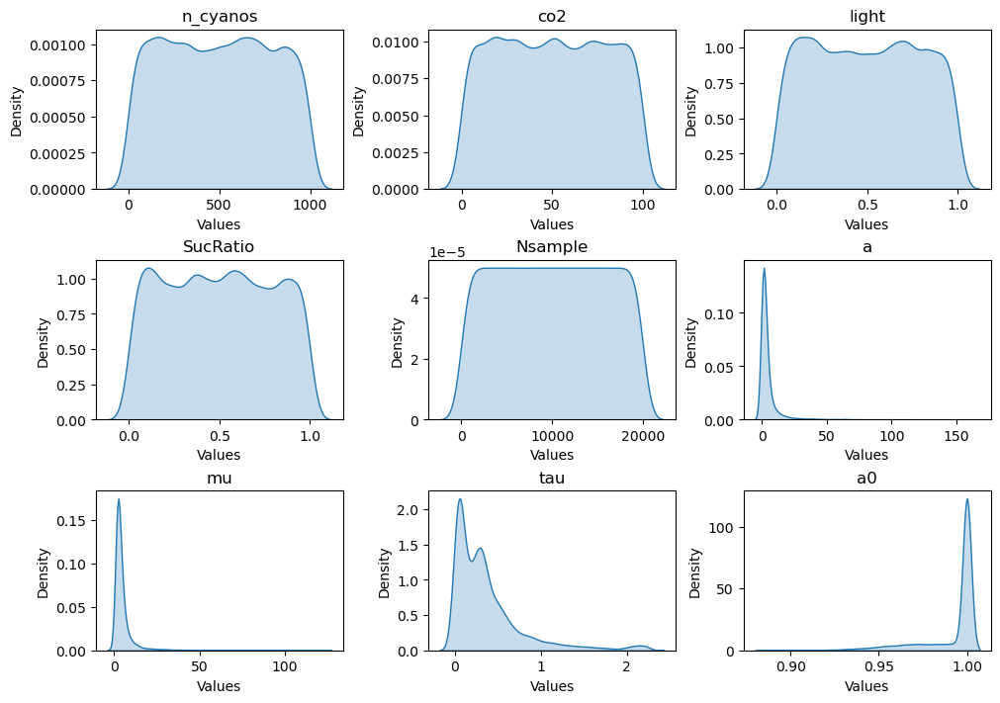

In [9]:
fig, axes = plt.subplots(3, 3, figsize=(10, 7), constrained_layout=True)
axes = axes.flatten()

for i in range(len(dataset2.columns)):
    sns.kdeplot(data=dataset2, x=dataset2.columns[i], ax=axes[i], fill=True)
    axes[i].set_title(f"{dataset2.columns[i]}")
    axes[i].set_xlabel("Values")
    axes[i].set_ylabel("Density")
plt.show()

### 2. Predict "a"

#### 2.1) Preprocessing

In this process, `df_a` is created from the original dataframe by dropping other target variables before tuning the model. Subsequently, all variables are explored the potential relationships between features and target variable.

In [100]:
df_a = dataset2.drop(['mu', 'tau', 'a0','Nsample'], axis=1)
df_a.head()

,n_cyanos,co2,light,SucRatio,a
0,262,73.578860,0.367894,0.451505,5.033993
1,610,74.582194,0.481606,0.969900,1.018406
2,118,33.111037,0.625418,0.909699,2.569159
3,159,8.027676,0.575251,0.137124,1.837341
4,957,38.796599,0.939799,0.234114,0.999268


The correlation matrix shows that `n_cyanos` variable has moderate correlation to target variable which is the potential predictor of the model.

In [103]:
df_a.corr()

,n_cyanos,co2,light,SucRatio,a
n_cyanos,1.000000,0.001203,-0.023443,0.006291,-0.444273
co2,0.001203,1.000000,-0.002829,0.000193,0.209350
light,-0.023443,-0.002829,1.000000,-0.015138,0.008905
SucRatio,0.006291,0.000193,-0.015138,1.000000,-0.195975
a,-0.444273,0.209350,0.008905,-0.195975,1.000000


The scatter plot between `n_cyanos` and the target variable exhibits an exponential trend, while the other features display a scattered pattern. Therefore, the logarithm of n_cyanos is taken to create a new feature (`log_n_cyanos`) for the regression model, which shows a stronger correlation with the target.

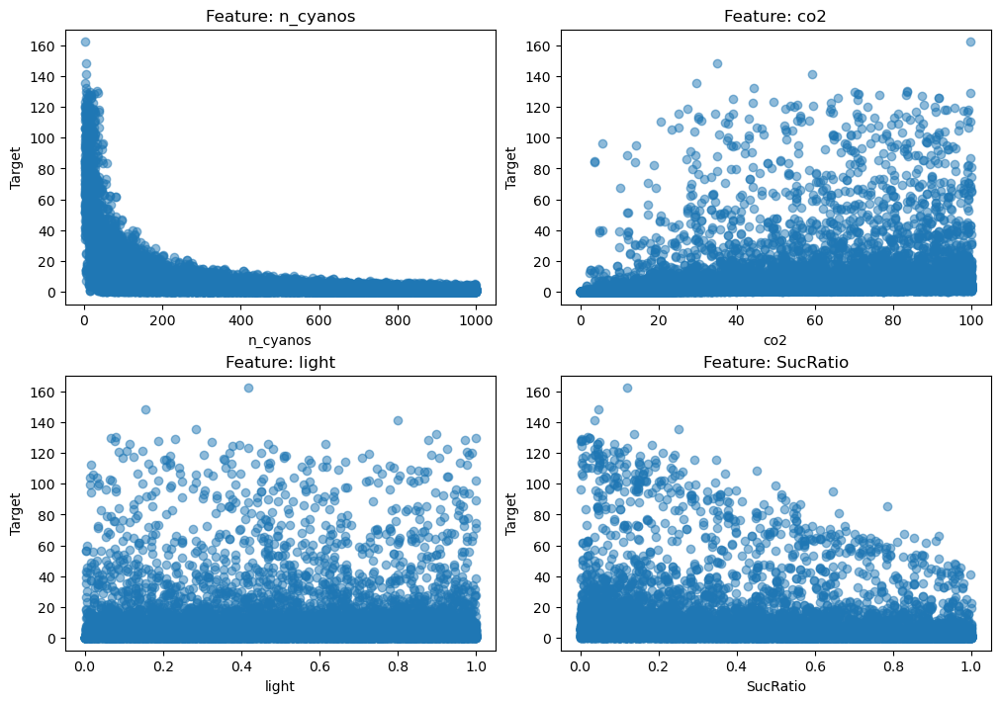

In [106]:
fig, axes = plt.subplots(2, 2, figsize=(10, 7), constrained_layout=True)
axes = axes.flatten()

i = 0
for column in df_a.columns[:-1]:
    axes[i].scatter(df_a[column].to_numpy(), df_a.iloc[:,-1].to_numpy(), alpha=0.5)
    axes[i].set_title(f"Feature: {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Target")
    i+=1
plt.show()

In [108]:
df_a['log_n_cyanos'] = np.log1p(df_a['n_cyanos'])
df_a.insert(0, 'log_n_cyanos', df_a.pop('log_n_cyanos'))
df_a.corr()

,log_n_cyanos,n_cyanos,co2,light,SucRatio,a
log_n_cyanos,1.000000,0.877678,-0.003038,-0.018008,0.009585,-0.704671
n_cyanos,0.877678,1.000000,0.001203,-0.023443,0.006291,-0.444273
co2,-0.003038,0.001203,1.000000,-0.002829,0.000193,0.209350
light,-0.018008,-0.023443,-0.002829,1.000000,-0.015138,0.008905
SucRatio,0.009585,0.006291,0.000193,-0.015138,1.000000,-0.195975
a,-0.704671,-0.444273,0.209350,0.008905,-0.195975,1.000000


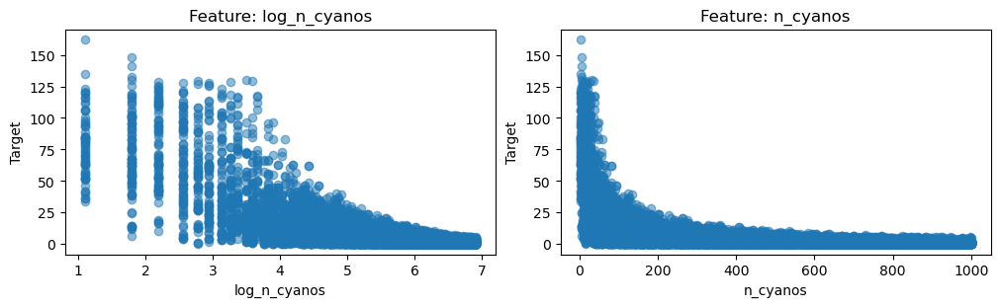

In [110]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), constrained_layout=True)
axes = axes.flatten()

i = 0
for column in df_a.columns[:2]:
    axes[i].scatter(df_a[column].to_numpy(), df_a.iloc[:,-1].to_numpy(), alpha=0.5)
    axes[i].set_title(f"Feature: {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Target")
    i+=1
plt.show()

In this investigation, two data scaling techniques, normalization and standardization, are applied to compare the performance of the regression model. Normalization scales the data to a range between 0 and 1, while standardization transforms the data to have a mean of 0 and a standard deviation of 1.

In [113]:
# Delect 'n_cyanos' column and use 'log_n_cyanos' instead
df_a.pop('n_cyanos')

# Normalize data
norm = MinMaxScaler().fit(df_a.iloc[:,:-1])
x_norm = norm.transform(df_a.iloc[:,:-1])

print("Range of data after normalization")
for i in range(x_norm.shape[1]):
    print(f'{i+1} {df_a.columns[i]}')
    print("Range =", round(x_norm.min(),2), " - ", round(x_norm.max(),2))
    
# Standardize data
scaler = StandardScaler().fit(df_a.iloc[:,:-1])
x_standard = scaler.transform(df_a.iloc[:,:-1])

print("")
print("Range of data after standardization")
for i in range(x_standard.shape[1]):
    print(f'{i+1} {df_a.columns[i]}')
    print("Range =", round(x_standard.min(),2), " - ", round(x_standard.max(),2))
    
# Taget
y = df_a.iloc[:,-1].to_numpy()

Range of data after normalization
1 log_n_cyanos
Range = 0.0  -  1.0
2 co2
Range = 0.0  -  1.0
3 light
Range = 0.0  -  1.0
4 SucRatio
Range = 0.0  -  1.0

Range of data after standardization
1 log_n_cyanos
Range = -4.85  -  1.74
2 co2
Range = -4.85  -  1.74
3 light
Range = -4.85  -  1.74
4 SucRatio
Range = -4.85  -  1.74


#### 2.2) Pipeline 1

In this pipeline, the model is trained using raw data without applying a scaling method. Support Vector Regression (SVR) is selected as the model structure, and hyperparameter tuning is performed using `GridSearchCV`, selecting the best model based on $R^2$.

**Model Training**

In [117]:
# Raw data
x = df_a.iloc[:,:-1].to_numpy()
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)

In [119]:
regressor = SVR(kernel = 'rbf')

# Define the parameter grid
param_grid = {'C': [1, 10, 100], 'gamma': ['scale', 'auto'], 'epsilon': [0.1, 0.5, 1.0]}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Parameters: {'C': 100, 'epsilon': 0.1, 'gamma': 'auto'}
Best Cross-Validated R^2 Score: 0.9517270212619671

Total execution time: 368.93 seconds


**Evaluation**

In [121]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance
Best Parameters: {'C': 100, 'epsilon': 0.1, 'gamma': 'auto'}
Best Cross-Validated R^2 Score: 0.9517

Test Set Performance:
R^2 Score: 0.9439
Mean Absolute Error (MAE): 0.6422
Mean Squared Error (MSE): 10.5459
Root Mean Squared Error (RMSE): 3.2474



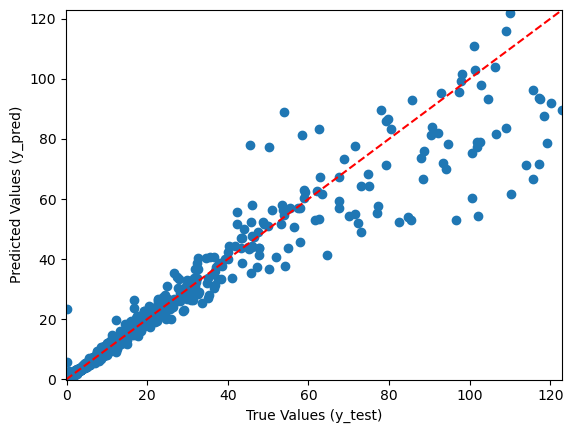

In [122]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The scatter plot between true value and predicted value shows high scatter from the identity line, suggesting that this model has low performance for high maximum number of bacteria seen (`a`).

#### 2.3) Pipeline 2

This pipeline aims to compare the performance of the Support Vector Regression (SVR) model when using normalized data. Hyperparameter tuning is conducted using `GridSearchCV`, with optimization based on the $R^2$ score to identify the best model configuration.


**Model Training**

In [126]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_norm, y, test_size=0.20, random_state=42)

In [127]:
regressor = SVR(kernel = 'rbf')

# Define the parameter grid
param_grid = {
    'C': [10, 100, 500],
    'gamma': ['scale', 'auto'],
    'epsilon': [0.1, 0.5, 1.0]
}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Parameters: {'C': 500, 'epsilon': 1.0, 'gamma': 'scale'}
Best Cross-Validated R^2 Score: 0.971751466554162

Total execution time: 587.60 seconds


**Evaluation**

In [129]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'C': 500, 'epsilon': 1.0, 'gamma': 'scale'}
Best Cross-Validated R^2 Score: 0.9718

Test Set Performance:
R^2 Score: 0.9716
Mean Absolute Error (MAE): 0.7980
Mean Squared Error (MSE): 5.3375
Root Mean Squared Error (RMSE): 2.3103



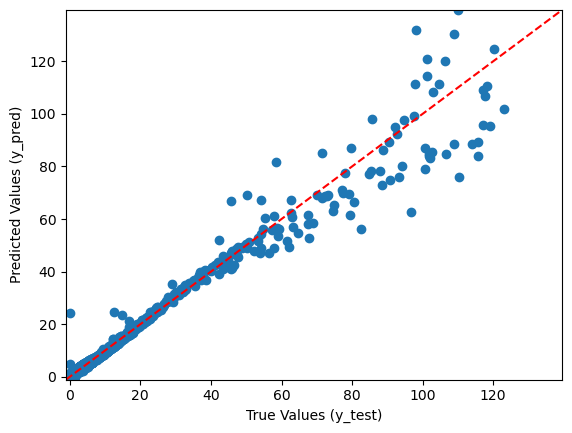

In [130]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The performance results demonstrate a high $R^2$ score with low error metrics compared to the first pipeline, indicating that data normalization is a crucial step in improving the performance of the regression model. The scatter plot of true values and predicted values reveals that the model performs well for lower values of `a`, with predictions closely aligning with the identity line. However, for higher values of `a`, the predictions are deviated from the identity line.

#### 2.4) Pipeline 3

This pipeline also utilizes the Support Vector Regression (SVR) model, but it is trained with standardized data. Hyperparameter tuning is performed using `GridSearchCV`, optimizing the model based on the $R^2$ score to determine the best configuration.

**Model Training**

In [134]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.20, random_state=42)

In [135]:
regressor = SVR(kernel = 'rbf')

# Define the parameter grid
param_grid = {'C': [10, 100, 500], 'gamma': ['scale', 'auto'], 'epsilon': [0.1, 0.5, 1.0]}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Parameters: {'C': 500, 'epsilon': 0.5, 'gamma': 'auto'}
Best Cross-Validated R^2 Score: 0.9802995615610307

Total execution time: 781.45 seconds


**Evaluation**

In [137]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'C': 500, 'epsilon': 0.5, 'gamma': 'auto'}
Best Cross-Validated R^2 Score: 0.9803

Test Set Performance:
R^2 Score: 0.9773
Mean Absolute Error (MAE): 0.4638
Mean Squared Error (MSE): 4.2720
Root Mean Squared Error (RMSE): 2.0669



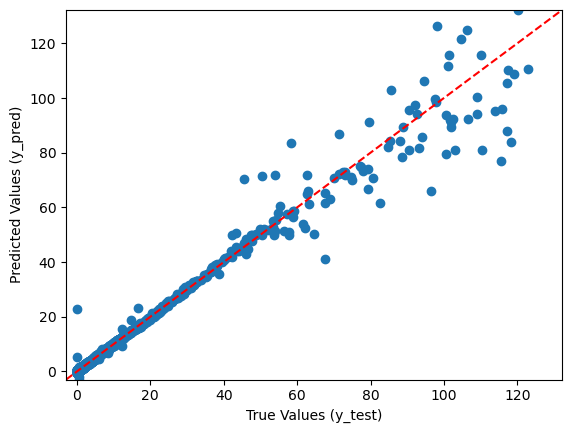

In [138]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The performance results demonstrate a high $R^2$ score with low error metrics compared to the first pipeline, while being slightly higher than those of Pipeline 2. This indicates that both normalization and standardization effectively improve the regression model's performance. However, the results suggest no significant difference in performance between using normalization or standardization for this dataset. The scatter plot of true values and predicted values reveals that the model performs well for lower values of `a`, with predictions closely aligning with the identity line. However, for higher values of `a`, the predictions are deviated from the identity line.

#### 2.5) Pipeline 4

The primary objective of this pipeline is to identify the most suitable kernel for the given dataset. The kernels, including linear, polynomial (poly), radial basis function (rbf), and sigmoid, are evaluated and tuned using `GridSearchCV`, with the best model selected based on the $R^2$ score. Since the previous pipeline demonstrated the highest performance when standardization was applied, the scaled data using standardization is chosen for model training in this pipeline.

In [141]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.20, random_state=42)

In [142]:
regressor = SVR(kernel = 'rbf', C = 500, epsilon = 0.1, gamma = 'scale')

# Define the parameter grid
param_grid = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best Parameters: {'kernel': 'rbf'}
Best Cross-Validated R^2 Score: 0.9799519597648126

Total execution time: 2351.54 seconds


In [143]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'kernel': 'rbf'}
Best Cross-Validated R^2 Score: 0.9800

Test Set Performance:
R^2 Score: 0.9772
Mean Absolute Error (MAE): 0.3210
Mean Squared Error (MSE): 4.2936
Root Mean Squared Error (RMSE): 2.0721



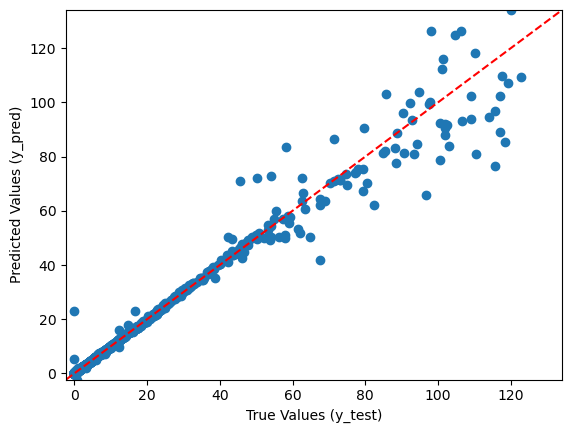

In [194]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The results indicate that using the RBF kernel provides the highest $R^2$ score among all kernel types, suggesting a non-linear relationship between the input features and the target variable. The performance metrics demonstrate a high $R^2$ score and low error values compared to the first and second pipelines but slightly lower than third pipeline. This demonstrates the importance of hyperparameter tuning in maximizing the efficiency and effectiveness of the regression model. The scatter plot of true values versus predicted values shows that the model performs well for lower values of `a`, with predictions closely aligning with the identity line. However, for higher values of `a`, the predictions deviate more significantly from the identity line, indicating potential challenges in accurately modeling high-value predictions.


### 3. Predict "mu"

#### 3.1) Preprocessing

Similar to the "a" prediction, `df_mu` is created from the original dataframe by excluding other target variables before tuning the model. Although the correlation matrix indicates a moderate correlation between `n_cyanos` and `mu`, with an observed exponential relationship, this investigation focuses on exploring complex models, including Gradient Boosting Regressor, XGBoost Regressor, and AdaBoost Regressor, for model training. As a result, the logarithmic transformation is not applied in this section. However, scaling techniques, including normalization and standardization, are still evaluated as part of the investigation.

In [219]:
df_mu = dataset2.drop(['a', 'tau', 'a0','Nsample'], axis=1)
df_mu.head()

,n_cyanos,co2,light,SucRatio,mu
0,262,73.578860,0.367894,0.451505,5.483011
1,610,74.582194,0.481606,0.969900,1.830727
2,118,33.111037,0.625418,0.909699,3.330662
3,159,8.027676,0.575251,0.137124,3.371570
4,957,38.796599,0.939799,0.234114,2.059303


In [221]:
df_mu.corr()

,n_cyanos,co2,light,SucRatio,mu
n_cyanos,1.000000,0.001203,-0.023443,0.006291,-0.442704
co2,0.001203,1.000000,-0.002829,0.000193,0.209381
light,-0.023443,-0.002829,1.000000,-0.015138,0.011367
SucRatio,0.006291,0.000193,-0.015138,1.000000,-0.231578
mu,-0.442704,0.209381,0.011367,-0.231578,1.000000


In [223]:
# Normalize data
norm = MinMaxScaler().fit(df_mu.iloc[:,:-1])
x_norm = norm.transform(df_mu.iloc[:,:-1])

print("Range of data after normalization")
for i in range(x_norm.shape[1]):
    print(f'{i+1} {dataset2.columns[i]}')
    print("Range =", round(x_norm.min(),2), " - ", round(x_norm.max(),2))

# Standardize data
scaler = StandardScaler().fit(df_mu.iloc[:,:-1])
x_standard = scaler.transform(df_mu.iloc[:,:-1])

print("")
print("Range of data after standardization")
for i in range(x_standard.shape[1]):
    print(f'{i+1} {dataset2.columns[i]}')
    print("Range =", round(x_standard.min(),2), " - ", round(x_standard.max(),2))
    
# Taget
y = df_mu.iloc[:,-1].to_numpy()

Range of data after normalization
1 n_cyanos
Range = 0.0  -  1.0
2 co2
Range = 0.0  -  1.0
3 light
Range = 0.0  -  1.0
4 SucRatio
Range = 0.0  -  1.0

Range of data after standardization
1 n_cyanos
Range = -1.71  -  1.75
2 co2
Range = -1.71  -  1.75
3 light
Range = -1.71  -  1.75
4 SucRatio
Range = -1.71  -  1.75


#### 3.2) Pipeline 1

In this pipeline, Gradient Boosting Regressor is selected as the regressor and trained using normalized data. The hyperparameter tuning is performed using `GridSearchCV`, selecting the best model based on $R^2$. 


**Model Traning**

In [227]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_norm, y, test_size=0.20, random_state=42)

In [229]:
# Regressor
regressor = GradientBoostingRegressor(random_state=42)

# Parameters grid
param_grid = {'n_estimators': [100, 200, 300], 'learning_rate': [0.01, 0.1, 0.2],'max_depth': [3, 5, 7]}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV with GradientBoostingRegressor
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}
Best Cross-Validated R^2 Score: 0.979118996430708

Total execution time: 295.24 seconds


**Evaluation**

In [231]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}
Best Cross-Validated R^2 Score: 0.9791

Test Set Performance:
R^2 Score: 0.9701
Mean Absolute Error (MAE): 0.4271
Mean Squared Error (MSE): 3.0084
Root Mean Squared Error (RMSE): 1.7345



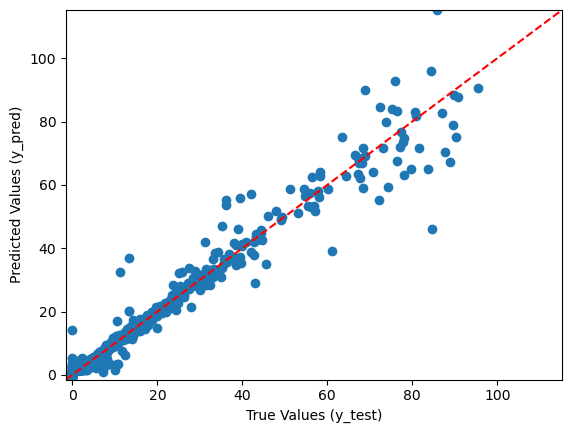

In [232]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The result indicates that although the input features are not highly corrlated with the target, the Gradient Boosting Regressor model still give the high performance of predicting `mu`. The performance metrics demonstrate a high $R^2$ score and low error values, suggesting high performance. Additionally, the scatter plot of true values versus predicted values reveals that the model performs well for most values, with predictions closely aligning with the identity line.

#### 3.3) Pipeline 2

Referring to the first pipeline, the Gradient Boosting Regressor demonstrated strong performance when applied to normalized data. This pipeline aims to compare its performance using standardized data as input. Hyperparameter tuning is conducted using `GridSearchCV`, with the best model selected based on the $R^2$ score to evaluate and optimize its effectiveness.


**Model Training**

In [236]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.20, random_state=42)

In [237]:
# Regressor
regressor = GradientBoostingRegressor(random_state=42)

# Parameters grid
param_grid = {'n_estimators': [100, 200, 300], 'learning_rate': [0.01, 0.1, 0.2],'max_depth': [3, 5, 7]}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV with GradientBoostingRegressor
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}
Best Cross-Validated R^2 Score: 0.9791833264481691

Total execution time: 296.41 seconds


**Evaluation**

In [239]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}
Best Cross-Validated R^2 Score: 0.9792

Test Set Performance:
R^2 Score: 0.9701
Mean Absolute Error (MAE): 0.4275
Mean Squared Error (MSE): 3.0004
Root Mean Squared Error (RMSE): 1.7322



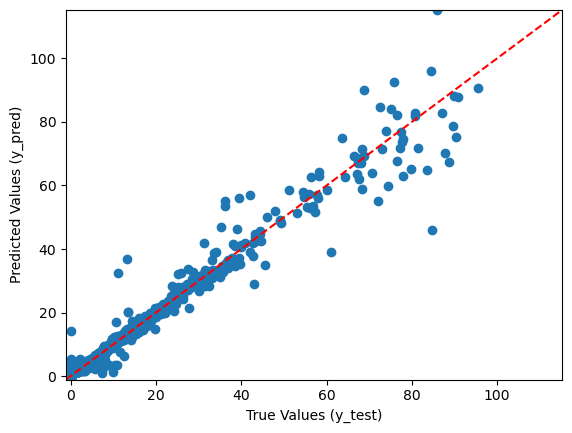

In [240]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

Similar to the Support Vector Regression model in the section 2, using standardized data for model training yields slightly better performance compared to normalized data. The performance metrics indicate a high $R^2$ score and low error values, highlighting high performance. The scatter plot of true values versus predicted values shows that the model performs well for most of the data, as the majority of scatter points closely align with the identity line.

#### 3.4) Pipeline 3

In this pipeline, standardized data is used for model training as it delivers higher performance compared to normalized data. The XGBoost Regressor is selected as the regressor model, with hyperparameter tuning conducted using `GridSearchCV` to optimize its performance.

**Model Traning**

In [243]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.20, random_state=42)

In [244]:
# Regressor
regressor = XGBRegressor(random_state=42, objective='reg:squarederror')

# Parameters grid
param_grid = {'n_estimators': [100, 200, 300], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [3, 5, 7]}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV with XGBRegressor
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}
Best Cross-Validated R^2 Score: 0.9791734998380892

Total execution time: 16.92 seconds


**Evaluation**

In [245]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}
Best Cross-Validated R^2 Score: 0.9792

Test Set Performance:
R^2 Score: 0.9705
Mean Absolute Error (MAE): 0.4339
Mean Squared Error (MSE): 2.9624
Root Mean Squared Error (RMSE): 1.7212



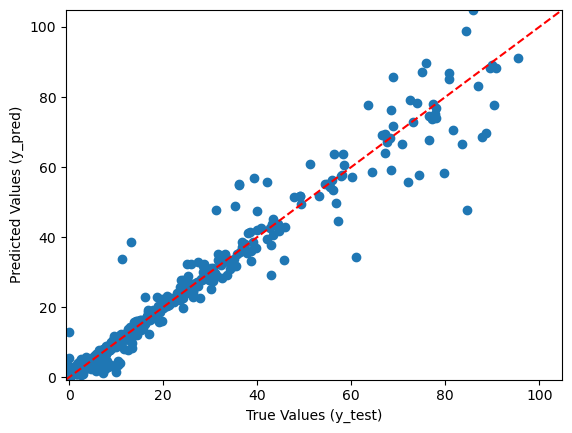

In [246]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The performance of the XGBoost Regressor and Gradient Boosting Regressor shows no significant difference in terms of $R^2$ score and error metrics. However, the execution time of the XGBoost Regressor is approximately 20 times faster than that of the Gradient Boosting Regressor. This suggests that XGBoost is more computationally efficient and better suited for this dataset.

#### 3.5) Pipeline 4

In this pipeline, the AdaBoost Regressor is selected and trained using standardized data. Hyperparameter tuning is performed with `GridSearchCV` to optimize the model's performance. The results are compared with those from the second and third pipelines to evaluate relative performance.

**Model Traning**

In [249]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.20, random_state=42)

In [250]:
# Regressor
regressor = AdaBoostRegressor(random_state=42)

# Parameters grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0],
    'loss': ['linear', 'square', 'exponential']  # Different loss functions
}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best Parameters: {'learning_rate': 0.1, 'loss': 'exponential', 'n_estimators': 200}
Best Cross-Validated R^2 Score: 0.8477578209942603

Total execution time: 109.43 seconds


**Evaluation**

In [251]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'learning_rate': 0.1, 'loss': 'exponential', 'n_estimators': 200}
Best Cross-Validated R^2 Score: 0.8478

Test Set Performance:
R^2 Score: 0.8512
Mean Absolute Error (MAE): 2.4898
Mean Squared Error (MSE): 14.9480
Root Mean Squared Error (RMSE): 3.8663



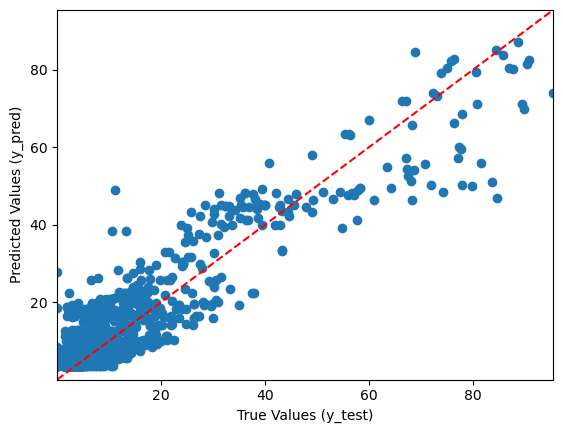

In [252]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

Although the execution time of the AdaBoost Regressor is faster than that of the Gradient Boosting Regressor, it remains around 10 times slower than the XGBoost Regressor. Most importantly, the scatter plot of true values versus predicted values shows that the majority of predictions deviate from the identity line, indicating low predictive accuracy. Finally, the AdaBoost Regressor achieves the lowest performance compared to other pipelines, suggesting that this dataset is too complex for the model.

### 4. Predict "tau"

#### 4.1) Preprocessing

The `df_tau` dataframe is created from the original dataframe by excluding other target variables before proceeding with model tuning. The correlation matrix reveals that `n_cyanos` is moderately correlated with `tau`, displaying an exponential relationship. To enhance this relationship, the logarithm of `n_cyanos` is computed, resulting in a feature that demonstrates a closer linear relationship with the target variable.

In [580]:
df_tau = dataset2.drop(['a', 'mu', 'a0','Nsample'], axis=1)
df_tau.head()

,n_cyanos,co2,light,SucRatio,tau
0,262,73.578860,0.367894,0.451505,0.552466
1,610,74.582194,0.481606,0.969900,0.156458
2,118,33.111037,0.625418,0.909699,0.412541
3,159,8.027676,0.575251,0.137124,0.260798
4,957,38.796599,0.939799,0.234114,0.098619


In [582]:
df_tau.corr()

,n_cyanos,co2,light,SucRatio,tau
n_cyanos,1.000000,0.001203,-0.023443,0.006291,-0.630056
co2,0.001203,1.000000,-0.002829,0.000193,0.398286
light,-0.023443,-0.002829,1.000000,-0.015138,0.016869
SucRatio,0.006291,0.000193,-0.015138,1.000000,-0.256130
tau,-0.630056,0.398286,0.016869,-0.256130,1.000000


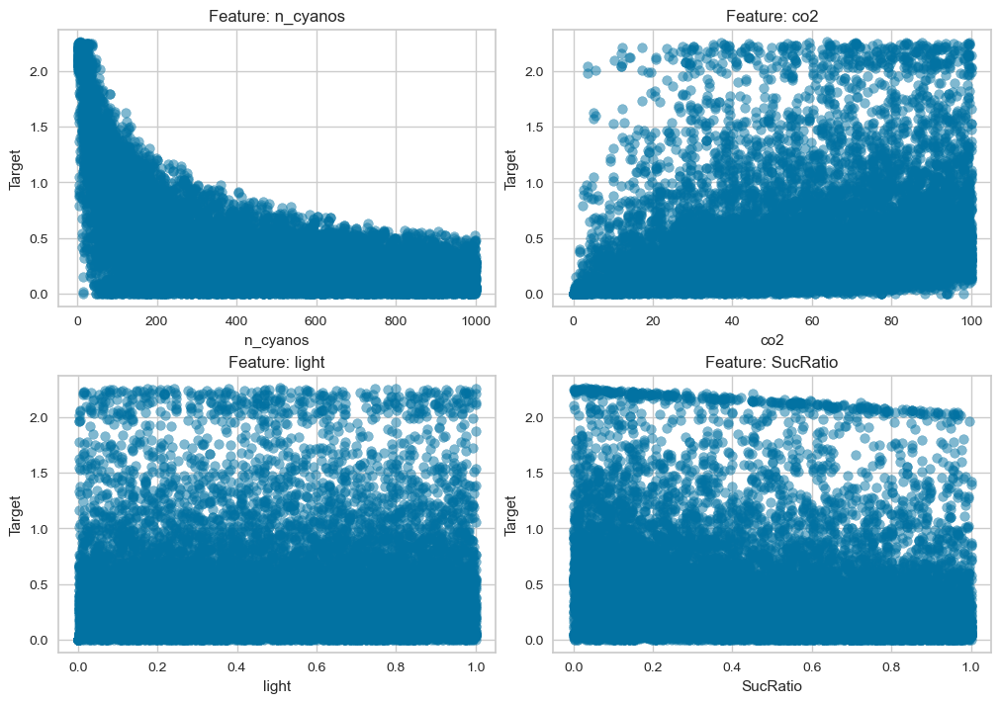

In [584]:
fig, axes = plt.subplots(2, 2, figsize=(10, 7), constrained_layout=True)
axes = axes.flatten()

i = 0
for column in df_tau.columns[:-1]:
    axes[i].scatter(df_tau[column].to_numpy(), df_tau.iloc[:,-1].to_numpy(), alpha=0.5)
    axes[i].set_title(f"Feature: {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Target")
    i+=1
plt.show()

In [586]:
df_tau['log_n_cyanos'] = np.log1p(df_tau['n_cyanos'])
df_tau.insert(0, 'log_n_cyanos', df_tau.pop('log_n_cyanos'))
df_tau.corr()

,log_n_cyanos,n_cyanos,co2,light,SucRatio,tau
log_n_cyanos,1.000000,0.877678,-0.003038,-0.018008,0.009585,-0.810863
n_cyanos,0.877678,1.000000,0.001203,-0.023443,0.006291,-0.630056
co2,-0.003038,0.001203,1.000000,-0.002829,0.000193,0.398286
light,-0.018008,-0.023443,-0.002829,1.000000,-0.015138,0.016869
SucRatio,0.009585,0.006291,0.000193,-0.015138,1.000000,-0.256130
tau,-0.810863,-0.630056,0.398286,0.016869,-0.256130,1.000000


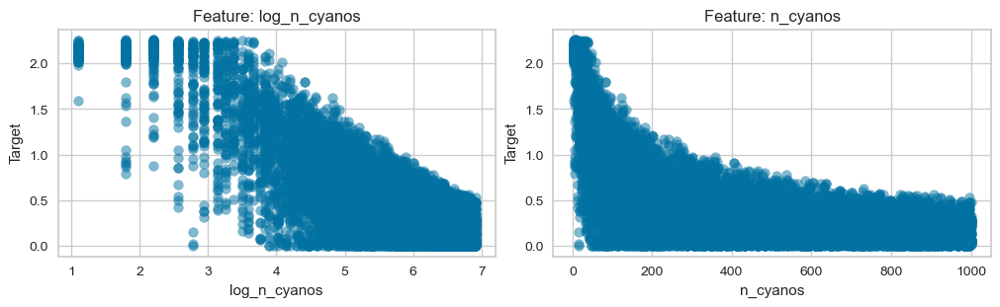

In [588]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), constrained_layout=True)
axes = axes.flatten()

i = 0
for column in df_tau.columns[:2]:
    axes[i].scatter(df_tau[column].to_numpy(), df_tau.iloc[:,-1].to_numpy(), alpha=0.5)
    axes[i].set_title(f"Feature: {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Target")
    i+=1
plt.show()

In [590]:
# Standardize data
scaler = StandardScaler().fit(df_tau.iloc[:,:-1])
x_standard = scaler.transform(df_tau.iloc[:,:-1])

print("")
print("Range of data after standardization")
for i in range(x_standard.shape[1]):
    print(f'{i+1} {df_tau.columns[i]}')
    print("Range =", round(x_standard.min(),2), " - ", round(x_standard.max(),2))
    
# Taget
y = df_tau.iloc[:,-1].to_numpy()


Range of data after standardization
1 log_n_cyanos
Range = -4.85  -  1.75
2 n_cyanos
Range = -4.85  -  1.75
3 co2
Range = -4.85  -  1.75
4 light
Range = -4.85  -  1.75
5 SucRatio
Range = -4.85  -  1.75


#### 4.2) Pipeline 1

Since the correlation matrix shows a high correlation that is close to a linear relationship, Linear Regression is selected for this pipeline. The model is trained using standardized data to account for differences in feature scales.

**Model Traning**

In [594]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.20, random_state=42)

In [150]:
# Start the timer
start_time = time.time()

# Regressor
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))


Total execution time: 0.01 seconds


In [152]:
# Predict on the test set
y_pred = linear_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Test Set Performance:
R^2 Score: 0.9014
Mean Absolute Error (MAE): 0.0851
Mean Squared Error (MSE): 0.0178
Root Mean Squared Error (RMSE): 0.1335



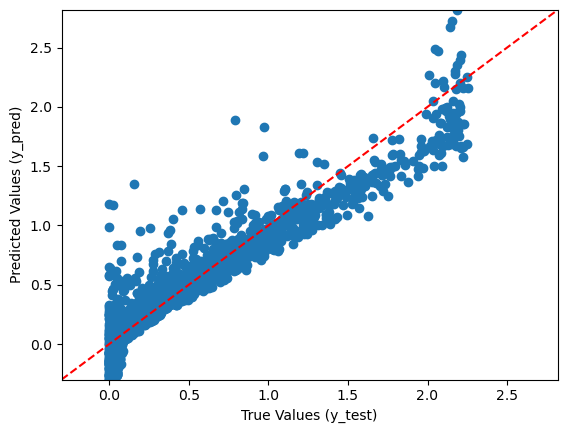

In [154]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The model evaluation shows the high $R^2$ and low error matric, indicating strong predictive power. However, from the visual inspection of the results, some issues are found at both the lower and upper boundaries of the data. This suggests that the model is less accurate in predicting extreme values.

#### 4.3) Pipeline 2

In this section, the Ridge Regression model is selected and trained using standardized data, with the aim of comparing the performance between standard Linear Regression and Ridge Linear Regression. The `alpha` value is tuned using cross-validation, and the best model is selected based on the $R^2$ score.

**Model Traning**

In [159]:
# Start the timer
start_time = time.time()

# Define RidgeCV model with alpha values
ridge_cv_model = RidgeCV(alphas=[0.001, 0.01, 0.1, 0.5, 1.0, 10.0, 100.0], scoring='r2', cv=5)

# Fit the RidgeCV model
ridge_cv_model.fit(X_train, y_train)

# Best alpha and score
print("Best Alpha:", ridge_cv_model.alpha_)
print("R^2 Score on Training Data:", ridge_cv_model.score(X_train, y_train))

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Best Alpha: 0.5
R^2 Score on Training Data: 0.9040058195134573

Total execution time: 0.09 seconds


**Evaluation**

In [162]:
# Predict on the test set
y_pred = ridge_cv_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Test Set Performance:
R^2 Score: 0.9014
Mean Absolute Error (MAE): 0.0851
Mean Squared Error (MSE): 0.0178
Root Mean Squared Error (RMSE): 0.1335



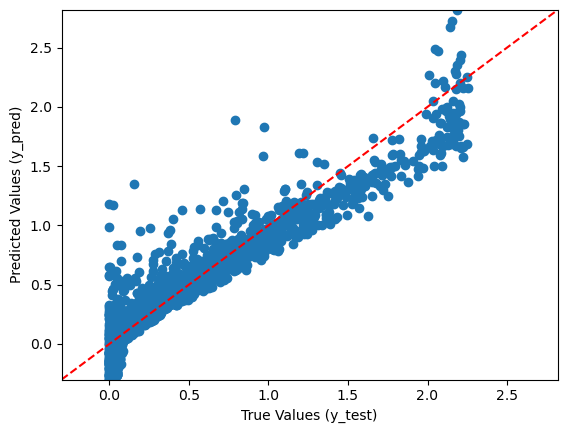

In [164]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The evaluation results and scatter plot reveal that both standard Linear Regression and Ridge Linear Regression yield the same performance, indicating the limitations of the linear regression model for this dataset.

#### 4.4) Pipeline 3

Referring to the previous pipeline, the Linear Regression model shows limitations in predicting the `tau` variable. Therefore, Support Vector Regression with a linear kernel is investigated in this pipeline as an alternative approach.


**Model Training**

In [596]:
regressor = SVR(kernel = 'linear')

# Define the parameter grid
param_grid = {'C': [10, 100, 500], 'epsilon': [0.1, 0.5, 1.0]}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best Parameters: {'C': 500, 'epsilon': 0.1}
Best Cross-Validated R^2 Score: 0.9026086779351438

Total execution time: 4613.83 seconds


**Evaluation**

In [598]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'C': 500, 'epsilon': 0.1}
Best Cross-Validated R^2 Score: 0.9026

Test Set Performance:
R^2 Score: 0.9001
Mean Absolute Error (MAE): 0.0855
Mean Squared Error (MSE): 0.0181
Root Mean Squared Error (RMSE): 0.1344



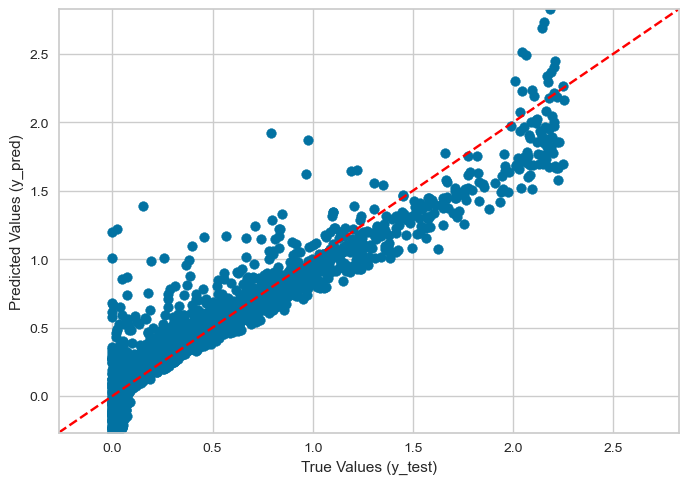

In [599]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The evaluation results and scatter plot show that Support Vector Regression with a linear kernel provides similar results to the Linear Regression model. However, the execution time is significantly higher than that of Linear Regression, suggesting that the Linear Regression model is more efficient in terms of computational cost.

#### 4.5) Pipeline 4

Referring to the previous pipelines, all models show low performance when predicting extreme values, suggesting a non-linear relationship in some parts of the data. Therefore, Support Vector Regression (SVR) with the RBF kernel is selected in this pipeline, with hyperparameter tuning performed using `GridSearchCV` to optimize the model.

**Model Training**

In [29]:
regressor = SVR(kernel = 'rbf')

# Define the parameter grid
param_grid = {
    'C': [10, 100, 300, 500],
    'epsilon': [0.1, 0.5, 1.0]
}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best Parameters: {'C': 10, 'epsilon': 0.1}
Best Cross-Validated R^2 Score: 0.9870766108356402

Total execution time: 21.02 seconds


In [30]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'C': 10, 'epsilon': 0.1}
Best Cross-Validated R^2 Score: 0.9871

Test Set Performance:
R^2 Score: 0.9856
Mean Absolute Error (MAE): 0.0361
Mean Squared Error (MSE): 0.0026
Root Mean Squared Error (RMSE): 0.0509



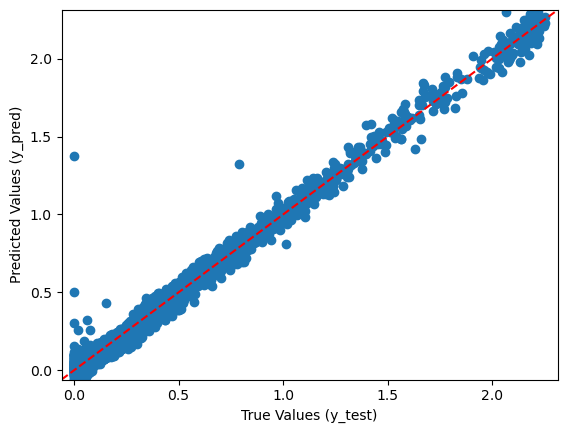

In [31]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

Although the execution time of this model is greater than that of Linear Regression, the evaluation results reveal that it provides the highest $R^2$ with extremely low error. Additionally, the scatter plot between predicted and actual values shows that most data points align closely with the identity line, with no boundary issues compared to the other pipelines. This indicates that Support Vector Regression with an RBF kernel is the most suitable model for this dataset.

### 5. Predict "a0"

#### 5.1) Preprocessing

The `df_a0` dataframe is created from the original dataframe by excluding other target variables before proceeding with model tuning. The correlation matrix shows that all features have low correlation with the target variable (`a0`). In this section, only the standardization process is applied to the dataframe to create the input array for model training.

In [351]:
df_a0 = dataset2.drop(['a', 'mu', 'tau','Nsample'], axis=1)
df_a0.head()

,n_cyanos,co2,light,SucRatio,a0
0,262,73.578860,0.367894,0.451505,1.0
1,610,74.582194,0.481606,0.969900,1.0
2,118,33.111037,0.625418,0.909699,1.0
3,159,8.027676,0.575251,0.137124,1.0
4,957,38.796599,0.939799,0.234114,1.0


In [353]:
df_a0.corr()

,n_cyanos,co2,light,SucRatio,a0
n_cyanos,1.000000,0.001203,-0.023443,0.006291,-0.277167
co2,0.001203,1.000000,-0.002829,0.000193,0.297470
light,-0.023443,-0.002829,1.000000,-0.015138,0.006131
SucRatio,0.006291,0.000193,-0.015138,1.000000,-0.219768
a0,-0.277167,0.297470,0.006131,-0.219768,1.000000


The scatter plot between the features and the target variable shows that the data points are mostly located near the upper boundary of 1, indicating skewness in the target variable. Furthermore, the features have no any clear linear or polynomial patterns.

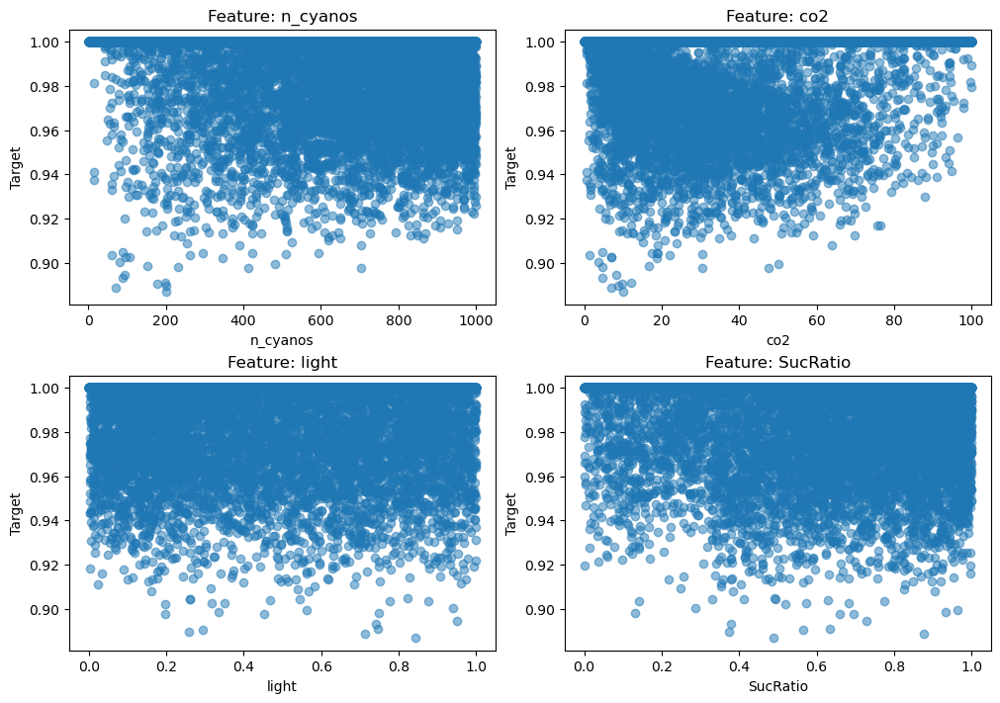

In [356]:
fig, axes = plt.subplots(2, 2, figsize=(10, 7), constrained_layout=True)
axes = axes.flatten()

i = 0
for column in df_a0.columns[:-1]:
    axes[i].scatter(df_a0[column].to_numpy(), df_a0.iloc[:,-1].to_numpy(), alpha=0.5)
    axes[i].set_title(f"Feature: {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Target")
    i+=1
plt.show()

In [358]:
# Standardize data
scaler = StandardScaler().fit(df_a0.iloc[:,:-1])
x_standard = scaler.transform(df_a0.iloc[:,:-1])

print("")
print("Range of data after standardization")
for i in range(x_standard.shape[1]):
    print(f'{i+1} {df_a0.columns[i]}')
    print("Range =", round(x_standard.min(),2), " - ", round(x_standard.max(),2))
    
# Tagetc
y = df_a0.iloc[:,-1].to_numpy()


Range of data after standardization
1 n_cyanos
Range = -1.71  -  1.75
2 co2
Range = -1.71  -  1.75
3 light
Range = -1.71  -  1.75
4 SucRatio
Range = -1.71  -  1.75


#### 5.2) Pipeline 1

Since there is no clear linear or polynomial pattern across all features, the Decision Tree Regression is selected as the regressor in this section because it is suitable for capturing non-linear relationships in complex datasets.

**Model Training**

In [417]:
# Create traning and testing data
X_train, X_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.20, random_state=42)

In [419]:
# Initialize the DecisionTreeRegressor
regressor = DecisionTreeRegressor()

# Define the parameter grid for DecisionTreeRegressor
param_grid = {'max_depth': [None, 10, 20, 30],
              'min_samples_split': [2, 10, 20],
              'min_samples_leaf': [1, 5, 10],}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best Parameters: {'max_depth': 20, 'min_samples_leaf': 10, 'min_samples_split': 10}
Best Cross-Validated R^2 Score: 0.6077793585520724

Total execution time: 3.51 seconds


**Evaluation**

In [421]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'max_depth': 20, 'min_samples_leaf': 10, 'min_samples_split': 10}
Best Cross-Validated R^2 Score: 0.6078

Test Set Performance:
R^2 Score: 0.6198
Mean Absolute Error (MAE): 0.0044
Mean Squared Error (MSE): 0.0001
Root Mean Squared Error (RMSE): 0.0106



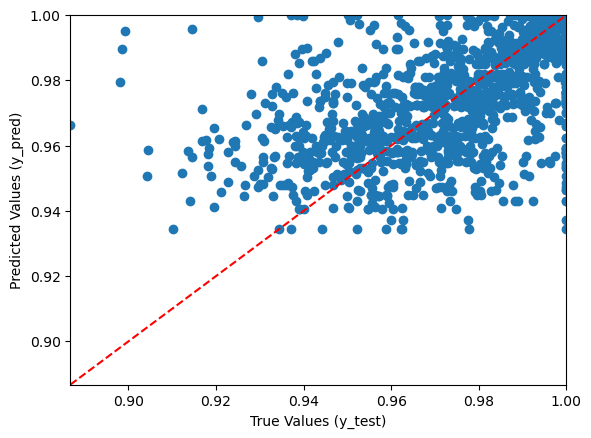

In [422]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

Although the model performs well in terms of error metrics, the low $R^2$ score indicates that the model struggles to predict certain target variable values accurately. This is evident in the scatter plot of predicted versus actual values, where many data points deviate significantly from the identity line.

#### 5.3) Pipeline 2

In this section, Random Forest Regression is selected for the model to compare its performance with Decision Tree Regression. The hyperparameters of the model are also optimized using `GridSearchCV`.

**Model Trianing**

In [462]:
regressor = RandomForestRegressor()

# Define the parameter grid
param_grid = {'n_estimators': [50, 100, 200, 500],
              'max_depth': [None, 10, 20, 30],
              'min_samples_split': [2, 10, 20],
              'min_samples_leaf': [1, 5, 10],}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best Parameters: {'max_depth': None, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 500}
Best Cross-Validated R^2 Score: 0.7117986688669667

Total execution time: 1978.12 seconds


**Evaluation**

In [463]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'max_depth': None, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 500}
Best Cross-Validated R^2 Score: 0.7118

Test Set Performance:
R^2 Score: 0.7118
Mean Absolute Error (MAE): 0.0040
Mean Squared Error (MSE): 0.0001
Root Mean Squared Error (RMSE): 0.0092



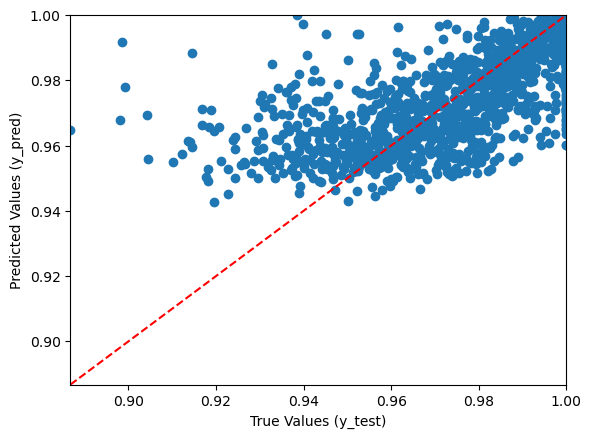

In [464]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The evaluation results demonstrate that Random Forest Regression slightly outperforms Decision Tree Regression, as evidenced by the higher $R^2$ value. However, the scatter plot of predicted values and true values shows that many data points deviate from the identity line, suggesting that the features may be insufficient for predicting the target variable.

#### 5.4) Pipeline 3

In this pipeline, Gradient Boosting Regressor is selected as the regressor and trained using standardized data. The hyperparameter tuning is performed using `GridSearchCV`, selecting the best model based on R square. 

In [477]:
# Regressor
regressor = GradientBoostingRegressor(random_state=42)

# Parameters grid
param_grid = {'n_estimators': [50, 100, 200, 300], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [3, 5, 7]}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50}
Best Cross-Validated R^2 Score: 0.680917549658665

Total execution time: 323.99 seconds


In [478]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50}
Best Cross-Validated R^2 Score: 0.6809

Test Set Performance:
R^2 Score: 0.6899
Mean Absolute Error (MAE): 0.0044
Mean Squared Error (MSE): 0.0001
Root Mean Squared Error (RMSE): 0.0096



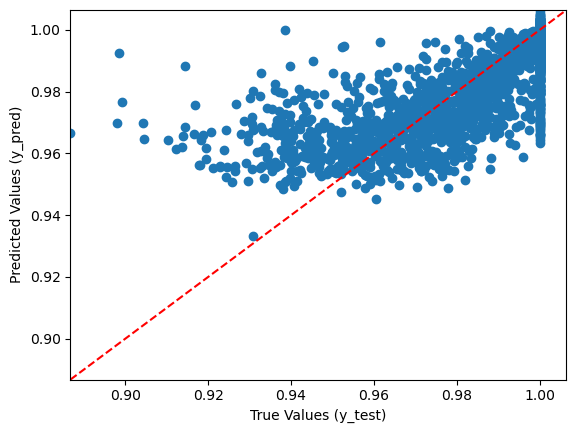

In [484]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The evaluation results suggest that the Gradient Boosting Regressor model provides better performance compared to Decision Tree Regression, although it performs slightly worse than Random Forest Regression. The scatter plot of predicted values versus true values reveals that the model struggles with predicting high boundary values.

#### 5.5) Pipeline 4

In this pipeline, XGBoost Regressor is selected as the regressor with the hypothesis that it will outperform Gradient Boosting Regression. The model is trained using standardized data, and hyperparameter tuning is performed using `GridSearchCV`, selecting the best model based on the $R^2$ score.

In [486]:
# Regressor
regressor = XGBRegressor(random_state=42, objective='reg:squarederror')

# Parameters grid
param_grid = {'n_estimators': [50, 100, 200, 500], 'learning_rate': [0.01, 0.1, 0.2, 0.5], 'max_depth': [3, 5, 7, 10]}

# Start the timer
start_time = time.time()

# Initialize GridSearchCV
grid_search = GridSearchCV(regressor, param_grid, cv=5, scoring='r2', verbose=1)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validated R^2 Score:", grid_search.best_score_)

# Stop the timer
end_time = time.time()
elapsed_time = end_time - start_time
print("")
print("Total execution time: {:.2f} seconds".format(elapsed_time))

Fitting 5 folds for each of 64 candidates, totalling 320 fits
Best Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 500}
Best Cross-Validated R^2 Score: 0.6856566788869783

Total execution time: 43.32 seconds


In [487]:
# Best model from GridSearchCV
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Compute metrics
r2_test = r2_score(y_test, y_pred)
mse_test = mean_squared_error(y_test, y_pred)
mae_test = mean_absolute_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)

# Print the performance report
print("Performance Report")
print("===================")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validated R^2 Score: {grid_search.best_score_:.4f}")
print("")
print("Test Set Performance:")
print(f"R^2 Score: {r2_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test:.4f}")
print("")

Performance Report
Best Parameters: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 500}
Best Cross-Validated R^2 Score: 0.6857

Test Set Performance:
R^2 Score: 0.6906
Mean Absolute Error (MAE): 0.0044
Mean Squared Error (MSE): 0.0001
Root Mean Squared Error (RMSE): 0.0096



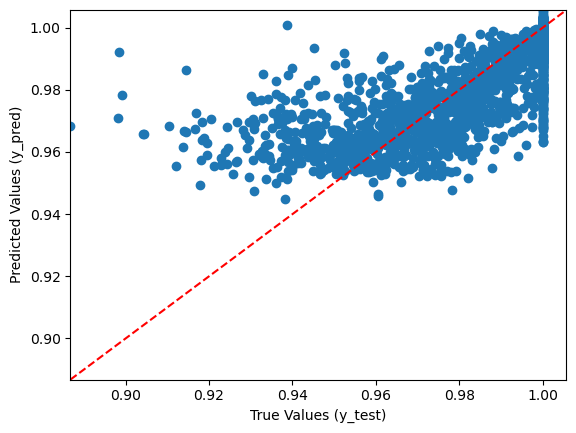

In [488]:
# Plot y_test and y_pred
min_val = min(min(y_test), min(y_pred))
max_val = max(max(y_test), max(y_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='y = x')
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xlabel("True Values (y_test)")
plt.ylabel("Predicted Values (y_pred)")
plt.scatter(y_test, y_pred)
plt.show()

**Discussion**

The evaluation results show that using XGBoost Regression instead of Gradient Boosting Regression does not result in a significant difference in predictive performance but more efficient in computational cost. The scatter plot of predicted values versus true values also reveals that the model still struggles to predict high boundary values. This suggests that the low correlation between features and the target variable is contributing to the model's lower performance.

### 6) Conclusion




This study reveals that support vector machine using RBF kernel which can capture non-linear relationship [3] and XGboost regression are suitable for this dataset. The correlation between features and target variable is esstential for creating the high performance model. Consequently, feature transformation such as taking logarithm to the exponential relashionship can be improved the model's performance. 

---
---
## Dataset 3: NLP

In this part of the coursework you will be looking at a dataset containing text from news articles. These are stored in a CSV file, however, as the news articles use commas you will need to use a tab as the separator when reading in the file.

The file contains just one feature - the news story, one per line.

The dataset can be downloaded from: https://ncl.instructure.com/courses/59112/files/8967387?wrap=1

## What you need to do:

You will need to perform the following steps on the dataset:
1. EDA
2. Build **two** pipelines to transform the text into a format which can be handled by a machine learning model
3. Work out how many types of news articles are present in the dataset
4. Present the results for your work in the most appropriate means.
5. Provide a short report on which approaches you used and which gave the best results.

Some help for good marks:
- This part of the coursework is all about how to convert the data into a format that you can feed into a machine learning model. It is not about using the machine learning models. Focus on how you can make your conversion as good as possible.
- We are not expecting a particular number for 'how many types of news articles are present'. This is more about you presenting the data and trying to justify a number.
- Hyperparameter tuning is essential for this.

## Your answer below

In [35]:
# Load library for this section
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.stem import PorterStemmer
import nltk
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import silhouette_score
import numpy as np
from tqdm import tqdm 
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
from sklearn.feature_extraction.text import TfidfVectorizer

### 1. Exploratory data analysis

The dataset contains 2225 stories from the news with the median of 326 words per article, ranging from 84 to 4428 words.

In [38]:
# Load data
dataset3 = pd.read_csv("news.csv", sep="\t")
dataset3.head()

,story
0,Quarterly profits at US media giant TimeWarner...
1,The dollar has hit its highest level against t...
2,The owners of embattled Russian oil giant Yuko...
3,British Airways has blamed high fuel prices fo...
4,Shares in UK drinks and food firm Allied Domec...


In [40]:
# Overall information
dataset3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2225 entries, 0 to 2224
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   story   2225 non-null   object
dtypes: object(1)
memory usage: 17.5+ KB


Median length:  326.0
Min length:  84
Max length:  4428


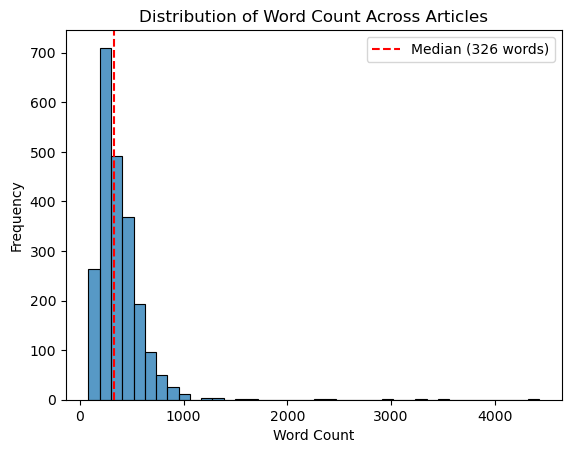

In [42]:
# Count words per article
dataset3['count'] = dataset3['story'].apply(lambda x: len(x.split()))
print("Median length: ", dataset3['count'].median())
print("Min length: ", dataset3['count'].min())
print("Max length: ", dataset3['count'].max())

sns.histplot(dataset3['count'], bins=40)
plt.axvline(x=326, color='red', linestyle='--', label='Median (326 words)')
plt.title('Distribution of Word Count Across Articles')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.legend()
plt.show()

Overall, the word cloud chart below shows that each article contains stop words that need to be filter out before building the model.

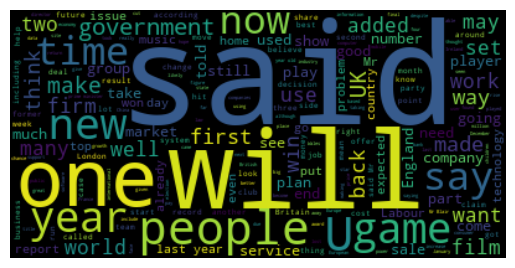

In [45]:
wordcloud = WordCloud().generate(" ".join(dataset3["story"]))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

For articles with an extremely low word count (fewer than 120 words), the word cloud chart suggests that these stories may fall into the category of political article.

Less than 120 words:  7 stories


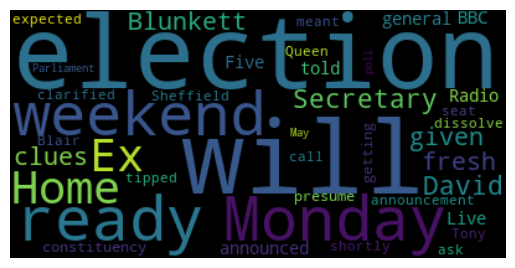

In [48]:
print('Less than 120 words: ', len(dataset3[dataset3['count'] < 120]), 'stories')
wordcloud = WordCloud().generate(" ".join(dataset3[dataset3['count'] < 100]['story']))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In contrast, the articles with an extremely high word count (more than 1000 words) may be catagorized into three types including politics, sports, and entertainment.

More than 1000 words:  21 stories


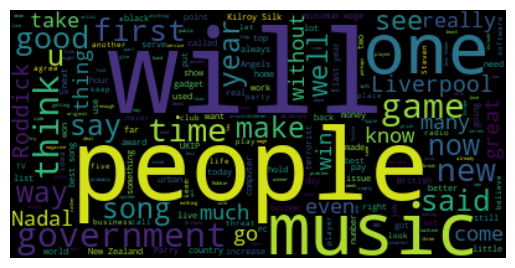

In [51]:
print('More than 1000 words: ', len(dataset3[dataset3['count'] > 1000]), 'stories')
wordcloud = WordCloud().generate(" ".join(dataset3[dataset3['count']> 1000]['story']))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 2. Pipeline

#### 2.1) Pipeline 1

In the first pipeline, `PorterStemmer` is used for text normalization, aiming to reduces the dimensionality of the text, while `CountVectorizer` is used for text vectorization. To identify the types of articles, $K-$means clustering is applied to explore the number of clusters within the articles and evaluated the model using silhouette score and distortion.

**Text Stemming**

In [442]:
# Download the punkt tokenizer
nltk.download('punkt')
nltk.download('punkt_tab')

# Create function for stem the text
stemmer = PorterStemmer()
def stem_text(text):
  sentence = nltk.word_tokenize(text)  # Breaks it up into individual words
  sentence = list(map(stemmer.stem, sentence))  # Stem each word
  return ' '.join(sentence)  # Join into a single string

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/chatwipa.s/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/chatwipa.s/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


After stemming, the text has been changed into a simplified form. However, some of the words have been reduced to non-meaningful words which are not easily recognizable by human.

In [445]:
dataset3['text_stem'] = dataset3['story'].apply(stem_text)
dataset3['text_stem']

0       quarterli profit at us media giant timewarn ju...
1       the dollar ha hit it highest level against the...
2       the owner of embattl russian oil giant yuko ar...
3       british airway ha blame high fuel price for a ...
4       share in uk drink and food firm alli domecq ha...
                              ...                        
2220    bt is introduc two initi to help beat rogu dia...
2221    comput user across the world continu to ignor ...
2222    a new european direct could put softwar writer...
2223    the man make sure us comput network are safe a...
2224    onlin role play game are time-consum , but ent...
Name: text_stem, Length: 2225, dtype: object

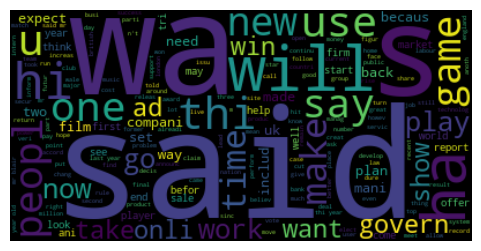

In [446]:
plt.figure(figsize=(6, 3))
wordcloud = WordCloud().generate(" ".join(dataset3['text_stem']))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

**$K-$means Clustering**

In [464]:
# Getting stemming text
X_text = dataset3['text_stem'].values

# Vectorizer
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b', stop_words='english', lowercase=True,
                             min_df = 0.3, max_df = 0.7 )

# K-mean clustering
kmean_cluster = KMeans(random_state=0, init='k-means++', n_init='auto')

# Pipeline
pipeline = Pipeline([('vectorizer', vectorizer), ('cluster', kmean_cluster)])

# Setting parameters for grid search
param_grid = {
    'vectorizer__min_df': [0.01, 0.03, 0.05, 0.07],
    'vectorizer__max_df': [0.7, 0.8, 0.9],
    'cluster__n_clusters': list(range(2, 21, 1)),
}

# Empty list setting
score_all, min_df_all, max_df_all, n_clusters_all, distortions_all = ([] for i in range(5))

for params in tqdm(ParameterGrid(param_grid), desc="Grid Search Progress", unit="combination"):
    # Fit pipeline with params
    pipeline.set_params(**params)
    pipeline.fit(X_text)
    
    # Calculate evaluation score
    labels = pipeline.named_steps['cluster'].labels_
    vectorized_data = pipeline.named_steps['vectorizer'].transform(X_text)
    sil_score = silhouette_score(vectorized_data, labels)
    distortion = np.sum(np.min(cdist(vectorized_data.toarray(),
                                     pipeline.named_steps['cluster'].cluster_centers_,
                                     'euclidean'),axis=1)**2) / vectorized_data.toarray().shape[0]
    # Evaluated parameters
    score_all.append(sil_score)
    n_clusters_all.append(params['cluster__n_clusters'])
    min_df_all.append(params['vectorizer__min_df'])
    max_df_all.append(params['vectorizer__max_df'])
    distortions_all.append(distortion)

print("Done")

Grid Search Progress: 100%|██████████| 228/228 [02:30<00:00,  1.51combination/s]

Done


**Model Evaluation**

In [466]:
dict_evaluate = {'n_cluster': n_clusters_all,
                 'min_df': min_df_all,
                 'max_df': max_df_all,
                 'Silhouette': score_all,
                 'Distortion': distortions_all} 
df_evaluate = pd.DataFrame(dict_evaluate)
df_average = df_evaluate.groupby('n_cluster').mean().reset_index()

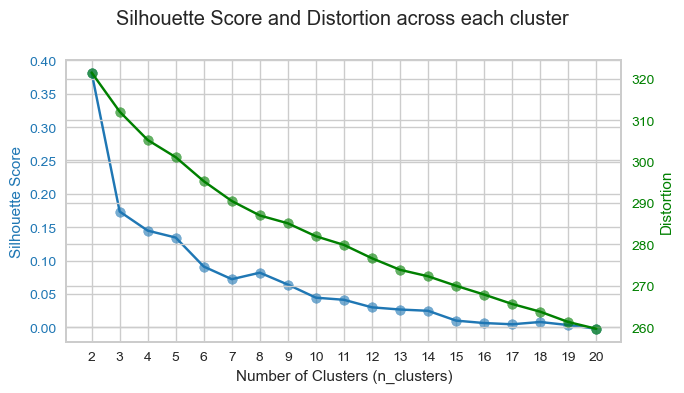

In [467]:
fig, ax1 = plt.subplots(figsize=(7, 4))
fig.suptitle('Silhouette Score and Distortion across each cluster')

# Plot for silhouette score
ax1.scatter(df_average['n_cluster'], df_average['Silhouette'], alpha=0.6, label='Silhouette Scores', color = 'tab:blue')
ax1.plot(df_average['n_cluster'], df_average['Silhouette'], color = 'tab:blue')
ax1.set_xlabel('Number of Clusters (n_clusters)')
ax1.set_ylabel('Silhouette Score', color = 'tab:blue')
ax1.tick_params(axis='y', labelcolor = 'tab:blue')
ax1.set_xticks(df_average['n_cluster'].unique())

# Plot for distortion
ax2 = ax1.twinx()
ax2.scatter(df_average['n_cluster'], df_average['Distortion'], alpha=0.6, label='Distortions', color='green')
ax2.plot(df_average['n_cluster'], df_average['Distortion'], color='green')
ax2.set_ylabel('Distortion', color='green')
ax2.tick_params(axis='y', labelcolor='green')
plt.tight_layout()
plt.show()

**Select Best Model**

Based on the silhouette and distortion plots, the elbow point may locate around 5 to 7 clusters, while the silhouette score remains stable for 3 to 5 clusters. Therefore, 5 cluster is selected for this pipeline. Additionally, a `min_df` of 0.07 and a `max_df` of 0.7 are chosen, as these parameters yield the highest silhouette score and the lowest distortion among all hyperparameters.

In [469]:
df_evaluate[df_evaluate['n_cluster'] == 5]

,n_cluster,min_df,max_df,Silhouette,Distortion
36,5,0.01,0.7,0.112388,391.235157
37,5,0.03,0.7,0.134136,313.535392
38,5,0.05,0.7,0.099004,252.224376
39,5,0.07,0.7,0.184672,208.828857
40,5,0.01,0.8,0.112711,396.540877
41,5,0.03,0.8,0.179510,334.891755
42,5,0.05,0.8,0.076390,263.442567
43,5,0.07,0.8,0.177520,212.836495
44,5,0.01,0.9,0.121200,405.344233
45,5,0.03,0.9,0.118790,333.863311


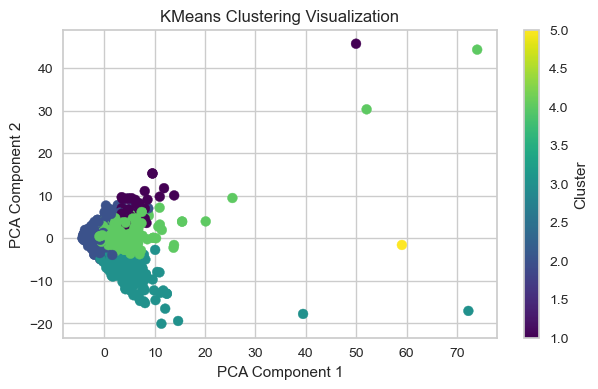

In [502]:
# Vectorizer and Kmean clustering setting
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b', stop_words='english', lowercase=True,
                             min_df = 0.07, max_df = 0.7 )
vectorized_data = vectorizer.fit_transform(X_text)
kmean_cluster = KMeans(n_clusters = 5,random_state=0, init='k-means++', n_init='auto')

# Model fitting
kmean_cluster.fit(vectorized_data)
labels = kmean_cluster.labels_
labels = labels + 1 #change 0-4 to 1-5

# Performing PCA for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(vectorized_data.toarray())

# Visualize clusters
plt.figure(figsize=(7, 4))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', s=50)
plt.title("KMeans Clustering Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Cluster")
plt.show()

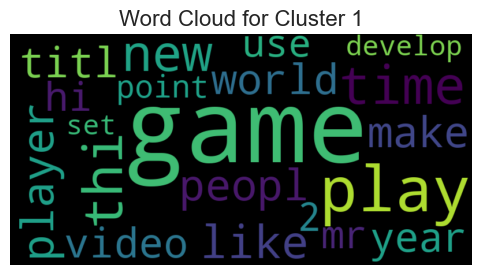

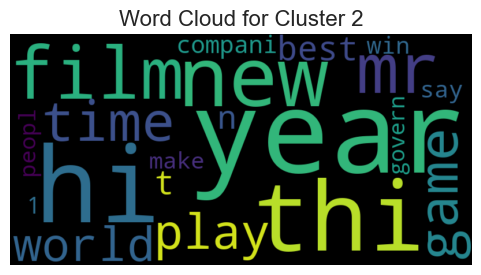

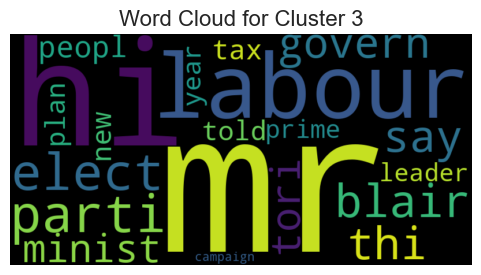

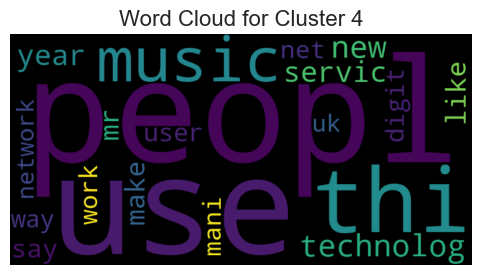

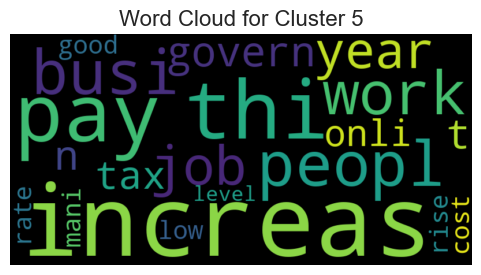

In [504]:
## Plot word cloud of each cluster
top_n = 20
feature_names = np.array(vectorizer.get_feature_names_out())
centroids = kmean_cluster.cluster_centers_
for i, centroid in enumerate(centroids):

    top_indices = centroid.argsort()[-top_n:][::-1]
    top_words = feature_names[top_indices]
    top_weights = centroid[top_indices]
    
    word_freq = {word: weight for word, weight in zip(top_words, top_weights)}
    wordcloud = WordCloud(width=800, height=400, colormap='viridis').generate_from_frequencies(word_freq)

    plt.figure(figsize=(6, 3))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud for Cluster {i+1}", fontsize=16)
    plt.show()

**Discussion**

The PCA plot reveals that four clusters exhibit some overlap of words, while Cluster 5 is distinctly separated from the others. The word cloud analysis indicates that each cluster corresponds to different article topics. However, Cluster 4 appears to contain two topics including music and technology. Therefore, increasing the number of clusters to 6 may result in more reasonable clustering.


#### 2.2) Pipeline 2

In this pipeline, the `WordNetLemmatizer` is used for text normalization instead of the stemming technique to preserve the meaning of words, allowing better interpretation. Additionally, `TfidfVectorizer` is used for text vectorization instead of `CountVectorizer` to emphasize the importance of words within the article.

**Text Lemmatization**

In [508]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

wnl = WordNetLemmatizer()

def lemmatize_text(text):
    sentence = nltk.word_tokenize(text)  # Tokenize the text
    sentence = list(map(wnl.lemmatize, sentence))  # Lemmatize each word
    return ' '.join(sentence)  # Join back into a single string

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/chatwipa.s/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [510]:
dataset3['text_lemmatize'] = dataset3['story'].apply(lemmatize_text)
dataset3['text_lemmatize']

0       Quarterly profit at US medium giant TimeWarner...
1       The dollar ha hit it highest level against the...
2       The owner of embattled Russian oil giant Yukos...
3       British Airways ha blamed high fuel price for ...
4       Shares in UK drink and food firm Allied Domecq...
                              ...                        
2220    BT is introducing two initiative to help beat ...
2221    Computer user across the world continue to ign...
2222    A new European directive could put software wr...
2223    The man making sure US computer network are sa...
2224    Online role playing game are time-consuming , ...
Name: text_lemmatize, Length: 2225, dtype: object

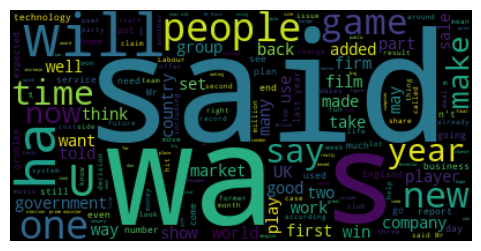

In [511]:
plt.figure(figsize=(6, 3))
wordcloud = WordCloud().generate(" ".join(dataset3['text_lemmatize']))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

**Model Training**

In [514]:
# Getting stemming text
X_text = dataset3['text_lemmatize'].values

# Vectorizer
vectorizer = TfidfVectorizer(token_pattern=r'\b\w+\b', stop_words='english', lowercase=True)

# K-mean clustering
kmean_cluster = KMeans(random_state=0, init='k-means++', n_init='auto')

# Pipeline
pipeline = Pipeline([('vectorizer', vectorizer), ('cluster', kmean_cluster)])

# Setting parameters for grid search
param_grid = {
    'vectorizer__min_df': [0.01, 0.03, 0.05, 0.07],
    'vectorizer__max_df': [0.8, 0.9],
    'cluster__n_clusters': list(range(2, 21, 1)),
}

# Empty list setting
score_all, min_df_all, max_df_all, n_clusters_all, distortions_all = ([] for i in range(5))

for params in tqdm(ParameterGrid(param_grid), desc="Grid Search Progress", unit="combination"):
    # Fit pipeline with params
    pipeline.set_params(**params)
    pipeline.fit(X_text)
    
    # Calculate evaluation score
    labels = pipeline.named_steps['cluster'].labels_
    vectorized_data = pipeline.named_steps['vectorizer'].transform(X_text)
    sil_score = silhouette_score(vectorized_data, labels)
    distortion = np.sum(np.min(cdist(vectorized_data.toarray(),
                                     pipeline.named_steps['cluster'].cluster_centers_,
                                     'euclidean'),axis=1)**2) / vectorized_data.toarray().shape[0]
    # Evaluated parameters
    score_all.append(sil_score)
    n_clusters_all.append(params['cluster__n_clusters'])
    min_df_all.append(params['vectorizer__min_df'])
    max_df_all.append(params['vectorizer__max_df'])
    distortions_all.append(distortion)

print("Done")

Grid Search Progress: 100%|██████████| 152/152 [01:30<00:00,  1.68combination/s]

Done


In [520]:
dict_evaluate2 = {'n_cluster': n_clusters_all,
                  'min_df': min_df_all,
                  'max_df': max_df_all,
                  'Silhouette': score_all,
                  'Distortion': distortions_all} 
df_evaluate2 = pd.DataFrame(dict_evaluate2)
df_average2 = df_evaluate2.groupby('n_cluster').mean().reset_index()
df_average2.head()

,n_cluster,min_df,max_df,Silhouette,Distortion
0,2,0.04,0.85,0.021764,0.900573
1,3,0.04,0.85,0.023892,0.884718
2,4,0.04,0.85,0.029841,0.868974
3,5,0.04,0.85,0.031440,0.858809
4,6,0.04,0.85,0.034374,0.848834


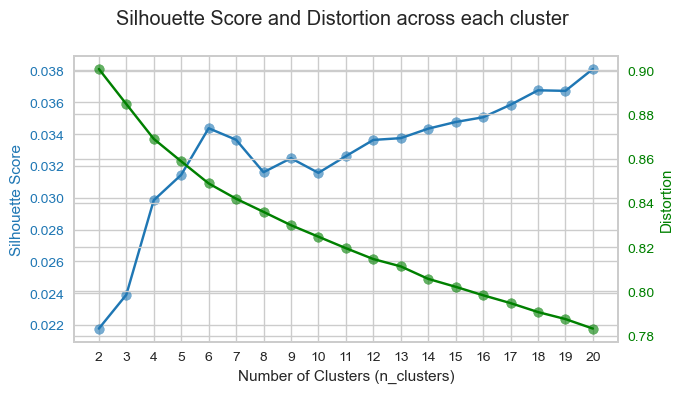

In [522]:
fig, ax1 = plt.subplots(figsize=(7, 4))
fig.suptitle('Silhouette Score and Distortion across each cluster')

# Scatter plot for silhouette score on the left y-axis
ax1.scatter(df_average2['n_cluster'], df_average2['Silhouette'], alpha=0.6, label='Silhouette Scores', color = 'tab:blue')
ax1.plot(df_average2['n_cluster'], df_average2['Silhouette'], color = 'tab:blue')
ax1.set_xlabel('Number of Clusters (n_clusters)')
ax1.set_ylabel('Silhouette Score', color = 'tab:blue')
ax1.tick_params(axis='y', labelcolor = 'tab:blue')

# Create a second y-axis for distortion
ax2 = ax1.twinx()
ax2.scatter(df_average2['n_cluster'], df_average2['Distortion'], alpha=0.6, label='Distortions', color='green')
ax2.plot(df_average2['n_cluster'], df_average2['Distortion'], color='green')
ax2.set_ylabel('Distortion', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Set x-axis to discrete
ax1.set_xticks(df_average2['n_cluster'].unique())

# Show plot
plt.tight_layout()
plt.show()

**Select Best Model**

The silhouette and distortion plots reveal that 6 cluster provide high silhouette score before drop in the next cluster, while the elbow point is located around 5 to 7. Therefore, 6 cluster is selected for this pipeline. Additionally, a `min_df` of 0.07 and a `max_df` of 0.8 are chosen, as these parameters yield the highest silhouette score and the lowest distortion among all hyperparameters.

In [548]:
df_evaluate2[df_evaluate2['n_cluster'] == 6]

,n_cluster,min_df,max_df,Silhouette,Distortion
32,6,0.01,0.8,0.023095,0.903438
33,6,0.03,0.8,0.031802,0.867038
34,6,0.05,0.8,0.039486,0.834374
35,6,0.07,0.8,0.044936,0.804754
36,6,0.01,0.9,0.022523,0.900841
37,6,0.03,0.9,0.030268,0.862115
38,6,0.05,0.9,0.039116,0.825356
39,6,0.07,0.9,0.043764,0.792761


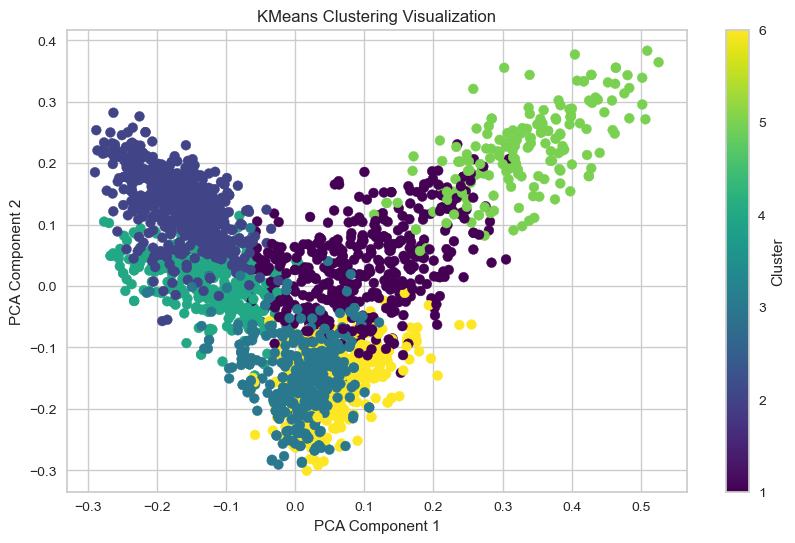

In [552]:
# Vectorizer and Kmean clustering setting
vectorizer = TfidfVectorizer(token_pattern=r'\b\w+\b', stop_words='english', lowercase=True, min_df = 0.03, max_df = 0.8)
vectorized_data = vectorizer.fit_transform(X_text)
kmean_cluster = KMeans(n_clusters = 6,random_state=0, init='k-means++', n_init='auto')

# Model fitting
kmean_cluster.fit(vectorized_data)
labels = kmean_cluster.labels_ + 1

# Performing PCA for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(vectorized_data.toarray())

# Visualize clusters
plt.figure(figsize=(10, 6))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', s=50)
plt.title("KMeans Clustering Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar(label="Cluster")
plt.show()

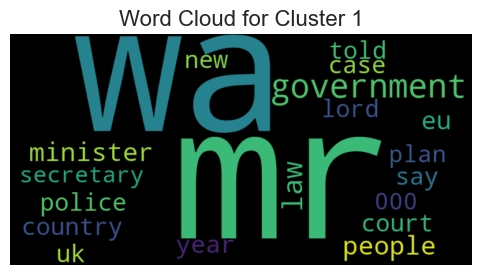

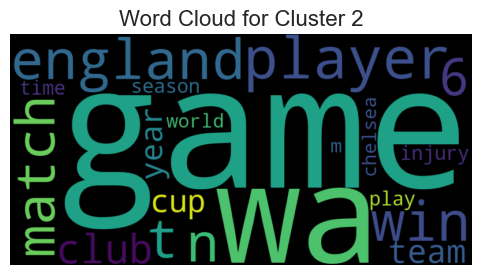

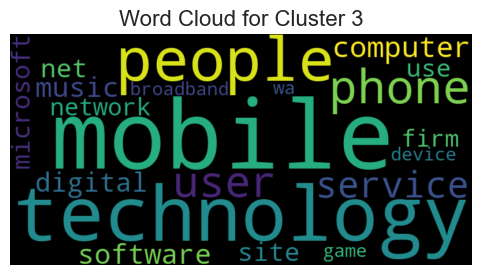

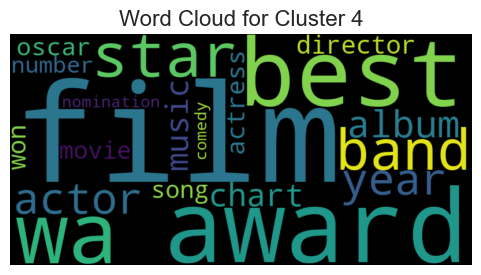

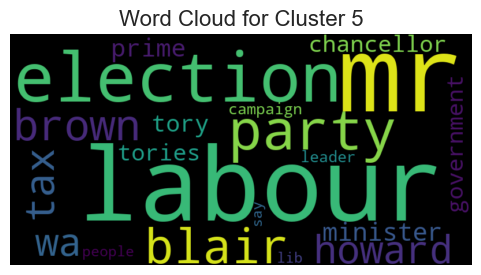

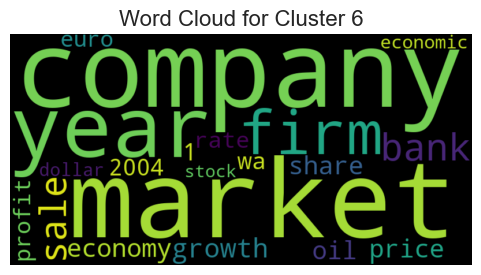

In [558]:
## Plot word cloud
top_n = 20
feature_names = np.array(vectorizer.get_feature_names_out())
centroids = kmean_cluster.cluster_centers_
for i, centroid in enumerate(centroids):

    top_indices = centroid.argsort()[-top_n:][::-1]
    top_words = feature_names[top_indices]
    top_weights = centroid[top_indices]
    
    word_freq = {word: weight for word, weight in zip(top_words, top_weights)}
    wordcloud = WordCloud(width=800, height=400, colormap='viridis').generate_from_frequencies(word_freq)

    plt.figure(figsize=(6, 3))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud for Cluster {i+1}", fontsize=16)
    plt.show()

**Discussion**

The PCA plot reveals some overlap in word composition across groups. However, the word cloud analysis suggests that each cluster represents distinct article topics including politics, sports, technology, entertainment, elections, and economics. Therefore, this dataset may contain six distinct article types of new.

### 3. Conclusion

This study suggests that both vectorizer techniques able to provide same results. However, the range of each article is not equal in this dataset, therefore, using `TfidVectorizer` which normalizes word frequencies provide more interpretable clusters when visualized with PCA [4].

Reference
- [1]	“Random Forest Classification with Scikit-Learn | DataCamp.” Accessed: Jan. 09, 2025. [Online]. Available: https://www.datacamp.com/tutorial/random-forests-classifier-python
- [2]	“XGBoost for Regression - MachineLearningMastery.com.” Accessed: Jan. 09, 2025. [Online]. Available: https://machinelearningmastery.com/xgboost-for-regression/
- [3]	“Support Vector Regression (SVR) using Linear and Non-Linear Kernels in Scikit Learn - GeeksforGeeks.” Accessed: Jan. 09, 2025. [Online]. Available: https://www.geeksforgeeks.org/support-vector-regression-svr-using-linear-and-non-linear-kernels-in-scikit-learn/
- [4]	“CountVectorizer vs TfidfVectorizer | by Shandeep Singh | Medium.” Accessed: Jan. 09, 2025. [Online]. Available: https://medium.com/@shandeep92/countvectorizer-vs-tfidfvectorizer-cf62d0a54fa4
